# 기재부 자료 분류

In [ ]:
import requests  # 웹 요청을 보내기 위한 라이브러리
import json      # JSON 데이터를 다루기 위한 라이브러리

# 1. 요청을 보낼 URL
url = "https://www.econedu.go.kr/common/system/code/comCdList"

# 2. 요청에 필요한 데이터 (POST로 보낼 데이터)
payload = {
    "p_up_cd_id": "0003",           # 상위 코드 ID
    # "opt1": "and A.cd_id = '0001'"   # 추가 조건문 (A.cd_id가 '0001'인 것만)
    "opt1":''
}

# 3. 요청 헤더 (웹사이트가 요청을 정상으로 인식하게 하는 역할)
headers = {
    "Content-Type": "application/x-www-form-urlencoded; charset=UTF-8",  # 보내는 데이터 타입
    "Origin": "https://www.econedu.go.kr",                               # 요청이 시작된 곳
    "Referer": "https://www.econedu.go.kr/user/findEcon/findEcon1/menu/list",  # 요청을 보낸 페이지
    "User-Agent": "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/135.0.0.0 Safari/537.36",  # 브라우저 정보
    "Accept": "application/json, text/javascript, */*; q=0.01",          # 응답 데이터 타입
    "X-Requested-With": "XMLHttpRequest"                                # AJAX 요청임을 표시
}

# 4. POST 요청 보내기
response = requests.post(url, data=payload, headers=headers)

# 5. 서버 응답이 성공했는지 확인
if response.status_code == 200:
    # 6. JSON 형태로 변환
    data = response.json()

# 7. 받아온 데이터 출력해보기
# 결과를 담을 딕셔너리 생성
grouped = {}

for el in data:
    first = el['d_cd_nm']
    second = el['d_vl2']

    # 'first' 항목이 이미 있다면 set에 추가, 없으면 새로 생성
    if first not in grouped:
        grouped[first] = set()
    grouped[first].add(second)

# 원하는 출력 형태로 변환
subject = []
for first, second_set in grouped.items():
    subject.append({
        'first': first,
        'second': second_set
    })
# print(len(subject))

concept = list()
# 출력 확인
for item in subject:
    if item['first'] in ['시장경제', '국가경제', '국제경제/외환', '금융', '경제학기초', '경제사']:
        concept.append(item)

len(concept), concept

(6,
 [{'first': '시장경제',
   'second': {'기업/생산성(경영, 마케팅)',
    '생산요소시장(노동, 자본, 천연자원)',
    '소득분배(고용, 임금조정)',
    '소비이론',
    '수요/공급',
    '시장경제 일반',
    '시장구조',
    '정부역할/시장실패',
    '행동경제학'}},
  {'first': '국가경제',
   'second': {'경제 현안분석',
    '경제동향/전망',
    '경제모형',
    '경제성장',
    '경제위기',
    '국가경제 일반(기타)',
    '물가',
    '소비/투자/수출입(GDP)',
    '재정정책',
    '통화정책'}},
  {'first': '국제경제/외환',
   'second': {'국제거시', '국제경제 일반', '국제금융', '국제기구', '무역', '환율'}},
  {'first': '경제학기초', 'second': {'경제/경제적 사고', '경제변수와 통계', '경제생활 일반', '경제주체'}},
  {'first': '경제사',
   'second': {'경제개발/발전', '경제사 일반', '경제이론', '경제체제', '경제학자/학파', '한국경제'}},
  {'first': '금융',
   'second': {'금융 일반', '금융기술', '노후대비', '세금/납세', '소비/지출', '신용/위험관리', '자산관리'}}])

In [36]:
kw = list()
for i in concept:
    j,k = [*i.values()]
    print(j,*k)
    kw.append(j)
    kw.extend([*k])
kw

시장경제 행동경제학 소득분배(고용, 임금조정) 소비이론 정부역할/시장실패 생산요소시장(노동, 자본, 천연자원) 수요/공급 시장경제 일반 기업/생산성(경영, 마케팅) 시장구조
국가경제 경제성장 재정정책 소비/투자/수출입(GDP) 경제 현안분석 통화정책 경제모형 물가 경제동향/전망 국가경제 일반(기타) 경제위기
국제경제/외환 국제거시 국제경제 일반 무역 국제금융 국제기구 환율
경제학기초 경제주체 경제변수와 통계 경제생활 일반 경제/경제적 사고
경제사 경제사 일반 경제개발/발전 경제학자/학파 경제이론 한국경제 경제체제
금융 소비/지출 금융기술 세금/납세 신용/위험관리 자산관리 노후대비 금융 일반


['시장경제',
 '행동경제학',
 '소득분배(고용, 임금조정)',
 '소비이론',
 '정부역할/시장실패',
 '생산요소시장(노동, 자본, 천연자원)',
 '수요/공급',
 '시장경제 일반',
 '기업/생산성(경영, 마케팅)',
 '시장구조',
 '국가경제',
 '경제성장',
 '재정정책',
 '소비/투자/수출입(GDP)',
 '경제 현안분석',
 '통화정책',
 '경제모형',
 '물가',
 '경제동향/전망',
 '국가경제 일반(기타)',
 '경제위기',
 '국제경제/외환',
 '국제거시',
 '국제경제 일반',
 '무역',
 '국제금융',
 '국제기구',
 '환율',
 '경제학기초',
 '경제주체',
 '경제변수와 통계',
 '경제생활 일반',
 '경제/경제적 사고',
 '경제사',
 '경제사 일반',
 '경제개발/발전',
 '경제학자/학파',
 '경제이론',
 '한국경제',
 '경제체제',
 '금융',
 '소비/지출',
 '금융기술',
 '세금/납세',
 '신용/위험관리',
 '자산관리',
 '노후대비',
 '금융 일반']

# 온용어 스크래핑

In [ ]:
import requests
from bs4 import BeautifulSoup
import time
import re
import csv

# 1. 스크래핑할 POST 요청 URL과 헤더를 설정합니다.
url = 'https://kli.korean.go.kr/term/search/getSearchList.do'
headers = {
    'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 '
                  '(KHTML, like Gecko) Chrome/136.0.0.0 Safari/537.36',
    'Referer': 'https://kli.korean.go.kr/term/search/indexSearchList.do',
}

# 2. 결과를 담을 리스트를 초기화합니다.
results = []

# 3. 페이지 번호를 1부터 시작해서, 더 이상 항목이 없을 때까지 반복합니다.
page = 1
while True:
    # 4. POST 요청에 필요한 폼 데이터를 설정합니다.
    data = {
        'listType':        'search',        # 검색 타입
        'pageIndex':       page,            # 현재 페이지 번호
        'pageUnit':        500,              # 페이지당 항목 수
        'sort':            'ka',            # 정렬 기준, ka:가나다순, cnt: 인기순
        'detailYn':         'Y',
        'imprmnRt':         'all',
        'realmNo':         '657',           # 분야 코드 (예: 657 = 경제학)
        'searchWord':      '',              # 검색어 (빈 문자열 = 전체)
        'wordTy':           'all',
        'trgtWordTy':       'all',
        'nkWordTy':         'all',
        'originTy':         'gls',
        'searchOrderby':    'ASC',
        'krGvrnLcnsTy':     'all'
        # 필요에 따라 다른 파라미터도 추가할 수 있습니다.
    }

    # 5. POST 요청을 보내고, 응답을 UTF-8로 디코딩합니다.
    resp = requests.post(url, headers=headers, data=data)
    resp.encoding = 'utf-8'
    soup = BeautifulSoup(resp.text, 'html.parser')

    # 6. 용어 항목의 컨테이너를 모두 선택합니다.
    items = soup.select('div.item_cont')
    # 더 이상 항목이 없으면 반복을 종료합니다.
    if not items:
        break

    # 7. 각 항목마다 필요한 정보를 추출해서 딕셔너리로 만듭니다.
    for item in items:
        term_no   = item.find('input', {'name':'listTrgtWordNo'})['value']   # 용어 고유번호
        weight    = item.find('input', {'name':'weight'})['value']           # 가중치
        korean    = re.sub(r'\^',' ',item.select_one('strong.kor').get_text(strip=True))       # 한글 표제어
        origin   = item.select_one('span.foreign').get_text(strip=True) if item.select_one('span.foreign') else ''  # 원어
        # 분야·정의문·사용 예시·원어 아이콘 정보 리스트
        # stars     = [span['data-title'] for span in item.select('span.imprmnRtTooltip span.ir_star')
        #              if span.has_attr('data-title')]
        # 생성일(‘2024. 9. 30.’ 형태)
        crt_dt    = ''.join(item.select_one('span.crtDt').stripped_strings)
        # 정의 문장
        if item.select_one('p.txt'):
            definition= item.select_one('p.txt').get_text(strip=True)
        else : definition = None
        realm     = item.select_one('p.realm').get_text(strip=True)          # 분야 분류
        source    = item.select_one('p.word_source strong').get_text(strip=True)  # 출처

        results.append({
            'term_no':    term_no,
            # 'weight':     weight,
            'korean':     korean,
            'origin':    origin, # 원어(한자, 영어 등)
            'origin_details': '',
            # 'tags':       stars,
            # 'crt_dt':     crt_dt, # 생성일
            'definition': definition,
            'realm':      realm, # 카테고리
            'source':     source, # 출처
        })

    print(f'페이지 {page} 완료: {len(items)}개 항목 수집했습니다.')
    page += 1
    # if page == 3: break
    time.sleep(0.5)  # 서버 부하를 줄이기 위해 1초 대기합니다.

페이지 1 완료: 500개 항목 수집했습니다.
페이지 2 완료: 500개 항목 수집했습니다.
페이지 3 완료: 500개 항목 수집했습니다.
페이지 4 완료: 500개 항목 수집했습니다.
페이지 5 완료: 500개 항목 수집했습니다.
페이지 6 완료: 500개 항목 수집했습니다.
페이지 7 완료: 500개 항목 수집했습니다.
페이지 8 완료: 500개 항목 수집했습니다.
페이지 9 완료: 500개 항목 수집했습니다.
페이지 10 완료: 500개 항목 수집했습니다.
페이지 11 완료: 500개 항목 수집했습니다.
페이지 12 완료: 500개 항목 수집했습니다.
페이지 13 완료: 500개 항목 수집했습니다.
페이지 14 완료: 500개 항목 수집했습니다.
페이지 15 완료: 500개 항목 수집했습니다.
페이지 16 완료: 500개 항목 수집했습니다.
페이지 17 완료: 500개 항목 수집했습니다.
페이지 18 완료: 500개 항목 수집했습니다.
페이지 19 완료: 500개 항목 수집했습니다.
페이지 20 완료: 500개 항목 수집했습니다.
페이지 21 완료: 500개 항목 수집했습니다.
페이지 22 완료: 500개 항목 수집했습니다.
페이지 23 완료: 500개 항목 수집했습니다.
페이지 24 완료: 500개 항목 수집했습니다.
페이지 25 완료: 500개 항목 수집했습니다.
페이지 26 완료: 500개 항목 수집했습니다.
페이지 27 완료: 500개 항목 수집했습니다.
페이지 28 완료: 500개 항목 수집했습니다.
페이지 29 완료: 500개 항목 수집했습니다.
페이지 30 완료: 500개 항목 수집했습니다.
페이지 31 완료: 500개 항목 수집했습니다.
페이지 32 완료: 500개 항목 수집했습니다.
페이지 33 완료: 500개 항목 수집했습니다.
페이지 34 완료: 500개 항목 수집했습니다.
페이지 35 완료: 500개 항목 수집했습니다.
페이지 36 완료: 500개 항목 수집했습니다.
페이지 37 완료: 500개 항목 수집했습니다.
페이지 38 완료:

In [ ]:
results[:5], results[-5:]

([{'term_no': '223700053',
   'korean': '3저 호황',
   'origin': '三低好況',
   'origin_details': {'三低好況': '한자'},
   'definition': '1980년대 중반 이후 전 세계적으로 나타난 저유가 · 저달러 · 저금리 현상을 가리키는 경제용어.',
   'realm': '사회과학 > 경제학',
   'source': '한국민족문화대백과사전',
   'exSentences': '',
   'translations': '',
   'related': ''},
  {'term_no': '223700063',
   'korean': '4월 사태',
   'origin': '四月事態',
   'origin_details': {'四月事態': '한자'},
   'definition': '1993년 3월∼4월에 아르헨티나 백구촌에서 일어난 한인과 아르헨티나인의 갈등 사건.',
   'realm': '사회과학 > 경제학',
   'source': '한국민족문화대백과사전',
   'exSentences': '',
   'translations': '',
   'related': ''},
  {'term_no': '223700094',
   'korean': '8·3긴급금융조치',
   'origin': '八三緊急金融措置',
   'origin_details': {'八三緊急金融措置': '한자'},
   'definition': '1972년 8월 3일 대통령의 긴급명령으로 발포된 경제의 안정과 성장에 관한 조치.',
   'realm': '사회과학 > 경제학',
   'source': '한국민족문화대백과사전',
   'exSentences': '',
   'translations': '',
   'related': ''},
  {'term_no': '223774208',
   'korean': 'BYC㈜',
   'origin': 'BYC 株',
   'origin_details': {'BYC': '영어

In [ ]:
# (3) 각 term_no마다 상세 페이지를 요청해서 cont_header, cont_dl, cont_dic 추출
for idx, entry in enumerate(results, start=1):
    term_no = entry['term_no']
    detail_url = f'https://kli.korean.go.kr/term/trgtWord/indexTrgtWord.do?trgtWordNo={term_no}'

    # 상세용어페이지 GET 요청
    resp = requests.get(detail_url, headers=headers)
    resp.encoding = 'utf-8'  # 한글 깨짐 방지
    soup = BeautifulSoup(resp.text, 'html.parser')

    # 원어 디테일 파싱
    dl_div     = soup.select_one('div.cont_dl')
    if dl_div:
        tds = dl_div.find_all('td')
        ths = dl_div.find_all('th')
        origin_details = {}  # 모든 언어 정보를 담을 빈 딕셔너리

    for td, th in zip(tds, ths):
        key = td.get_text(strip=True)   # 'DB', '融投資株'
        val = th.get_text(strip=True)   # '영어', '한자'
        origin_details[key] = val       # e.g. {'DB':'영어', '融投資株':'한자'}

    # 사용 예시 list
    # div.cont_dic > div.example 요소를 찾되, 없으면 None 반환
    example_div = soup.select_one('div.cont_dic > div.example')

    if example_div is not None:
        # li.example_strong 요소들을 찾아 텍스트 리스트 생성
        exSentences = [
            item.get_text(separator=' ', strip=True)
            for item in example_div.select('li.example_strong')
        ]
        # li 태그가 하나도 없다면 빈 문자열로 처리
        if not exSentences:
            exSentences = ''
    else:
        # example_div 자체가 없으면 빈 문자열
        exSentences = ''

    # --- 2-1) 대역어(translation) 추출 ---
    translations = []
    # tit_trnslatWord 클래스의 <strong> 태그를 찾아서 부모 컨테이너(div.trgtwordInfo)를 가져옴
    trans_strong = soup.find('strong', class_='tit_trnslatWord')
    if trans_strong:
        container = trans_strong.find_parent('div', class_='trgtwordInfo')
        # 각 <li class="interval"> 태그를 순회하면서 언어와 번역어 추출
        for li in container.select('li.interval'):
            # <strong> 태그 안의 언어명 (예: '<영어>')
            lang = li.find('strong').get_text(strip=True)
            # li 전체 텍스트에서 언어명 부분만 제거하면 순수 번역어만 남음
            text = li.get_text(strip=True).replace(lang, '', 1).strip()
            translations.append({
                'language': lang,          # 언어명
                'translation': text        # 번역어
            })

    # --- 2-2) 관련 용어명(related terms) 추출 ---
    related = []
    # tit_relatedWord 클래스의 <strong> 태그를 찾아서 부모 컨테이너(div.trgtwordInfo)를 가져옴
    rel_strong = soup.find('strong', class_='tit_relatedWord')
    if rel_strong:
        container = rel_strong.find_parent('div', class_='trgtwordInfo')
        # 각 <li class="interval"> 태그를 순회하면서 카테고리와 용어 리스트 추출
        for li in container.select('li.interval'):
            # <strong class="category"> 태그 안의 카테고리명 (예: '참고어')
            category = li.find('strong', class_='category').get_text(strip=True)
            # <a.relate_word_font> 태그를 모두 찾아 텍스트만 리스트로 수집
            terms = set(
                re.sub(r'\^',' ',a.get_text(strip=True).split('《')[0])  # '전자^화폐' 같은 경우에도 '《...》' 앞까지만
                for a in li.select('a.relate_word_font')
            )
            related.append({
                'category': category,      # 카테고리명
                'values': terms            # 용어 리스트
            })

    # results에 상세페이지 데이터 추가 저장. 선택 결과가 None일 수도 있으니, 있을 때만 텍스트 또는 HTML로 저장
    entry['origin_details']     = origin_details                    if dl_div     else ''
    entry['exSentences']    = exSentences               if exSentences    else ''
    entry['translations']    = translations               if translations    else ''
    entry['related']    = related               if related    else ''


    print(f"[{idx}/{len(results)}] term_no={term_no} 상세 정보 수집 완료")
    time.sleep(0.2)  # 서버 과부하 방지를 위해 잠시 대기

[1/34925] term_no=223700053 상세 정보 수집 완료
[2/34925] term_no=223700063 상세 정보 수집 완료
[3/34925] term_no=223700094 상세 정보 수집 완료
[4/34925] term_no=223774208 상세 정보 수집 완료
[5/34925] term_no=223774210 상세 정보 수집 완료
[6/34925] term_no=223774211 상세 정보 수집 완료
[7/34925] term_no=223774212 상세 정보 수집 완료
[8/34925] term_no=223774214 상세 정보 수집 완료
[9/34925] term_no=223774215 상세 정보 수집 완료
[10/34925] term_no=223774216 상세 정보 수집 완료
[11/34925] term_no=223774217 상세 정보 수집 완료
[12/34925] term_no=223774218 상세 정보 수집 완료
[13/34925] term_no=223774220 상세 정보 수집 완료
[14/34925] term_no=223774226 상세 정보 수집 완료
[15/34925] term_no=223774231 상세 정보 수집 완료
[16/34925] term_no=223774229 상세 정보 수집 완료
[17/34925] term_no=223774237 상세 정보 수집 완료
[18/34925] term_no=223774238 상세 정보 수집 완료
[19/34925] term_no=223774239 상세 정보 수집 완료
[20/34925] term_no=223774240 상세 정보 수집 완료
[21/34925] term_no=223774241 상세 정보 수집 완료
[22/34925] term_no=223774244 상세 정보 수집 완료
[23/34925] term_no=223774245 상세 정보 수집 완료
[24/34925] term_no=223774249 상세 정보 수집 완료
[25/34925] term_no=223774

In [ ]:
results[:5], results[-5:]

([{'term_no': '223700053',
   'korean': '3저 호황',
   'origin': '三低好況',
   'origin_details': {'三低好況': '한자'},
   'definition': '1980년대 중반 이후 전 세계적으로 나타난 저유가 · 저달러 · 저금리 현상을 가리키는 경제용어.',
   'realm': '사회과학 > 경제학',
   'source': '한국민족문화대백과사전',
   'exSentences': '',
   'translations': '',
   'related': ''},
  {'term_no': '223700063',
   'korean': '4월 사태',
   'origin': '四月事態',
   'origin_details': {'四月事態': '한자'},
   'definition': '1993년 3월∼4월에 아르헨티나 백구촌에서 일어난 한인과 아르헨티나인의 갈등 사건.',
   'realm': '사회과학 > 경제학',
   'source': '한국민족문화대백과사전',
   'exSentences': '',
   'translations': '',
   'related': ''},
  {'term_no': '223700094',
   'korean': '8·3긴급금융조치',
   'origin': '八三緊急金融措置',
   'origin_details': {'八三緊急金融措置': '한자'},
   'definition': '1972년 8월 3일 대통령의 긴급명령으로 발포된 경제의 안정과 성장에 관한 조치.',
   'realm': '사회과학 > 경제학',
   'source': '한국민족문화대백과사전',
   'exSentences': '',
   'translations': '',
   'related': ''},
  {'term_no': '223774208',
   'korean': 'BYC㈜',
   'origin': 'BYC 株',
   'origin_details': {'BYC': '영어

In [ ]:
for i in results:
    if i['term_no']=='223100009':
        print(i)

{'term_no': '223100009', 'korean': '가감 조정 금리', 'origin': '加減調整金利', 'origin_details': {'加減調整金利': '한자'}, 'definition': '금융 기관에서 대출, 채권 따위의 금리를 결정할 때 기준 금리와 가산 금리에 외에 덧붙여 조절하는 금리. ‘부수 거래 감면 금리’와 ‘본부·영업점 조정 금리’ 따위가 있다.', 'realm': '사회과학 > 경제학', 'source': '우리말샘', 'exSentences': ['가산 금리는 은행별 업무 원가, 법적 비용, 위험 프리미엄, 목표 이익률, 가감 조정 금리 등으로 구성된다. 《파이낸셜뉴스 2016년 12월》', '다음 달부터 은행들은 신용 대출 금리를 공시할 때 지점장 전결로 주는 각종 가감 조정 금리 를 공개해야 한다. 《조선비즈 2019년 11월》'], 'translations': '', 'related': ''}


In [ ]:
# csv로 저장

keys = results[0].keys()
with open('korean_terms_detailed.csv', 'w', encoding='utf-8', newline='') as f:
    writer = csv.DictWriter(f, fieldnames=keys)
    writer.writeheader()
    writer.writerows(results)

print(f"총 {len(results)}개의 상세 페이지 데이터를 korean_terms_detailed.csv에 저장했습니다.")


총 34925개의 상세 페이지 데이터를 korean_terms_detailed.csv에 저장했습니다.


In [ ]:
# json으로 저장

import json

# set 타입을 list로 변환해 주는 default 함수
def set_to_list(o):
    if isinstance(o, set):
        return list(o)
    raise TypeError(f"Type {type(o)} not serializable")

with open('korean_terms_detailed.json', 'w', encoding='utf-8') as f:
    json.dump(
        results,
        f,
        ensure_ascii=False,
        indent=4,
        default=set_to_list  # set 발견 시 list로 변환
    )

print(f"총 {len(results)}개의 상세 페이지 데이터를 korean_terms_detailed.json에 저장했습니다.")


총 34925개의 상세 페이지 데이터를 korean_terms_detailed.json에 저장했습니다.


# 경제학 책 목차(yes24)

In [ ]:
import requests
from bs4 import BeautifulSoup
import time

def fetch_book_list(disp_no, page, size):
    url = (
        f"https://m.yes24.com/Category/CategoryProductContents"
        f"?dispNo={disp_no}&page={page}&size={size}&viewMode=list"
    )
    resp = requests.get(url)
    resp.raise_for_status()
    soup = BeautifulSoup(resp.text, "html.parser")
    # .item 클래스가 붙은 <li> 태그들이 책 한 권씩을 나타냅니다.
    return soup.select("li.item")

def fetch_table_of_contents(book_detail_url):
    resp = requests.get(book_detail_url)
    resp.raise_for_status()
    soup = BeautifulSoup(resp.text, "html.parser")

    toc_div = soup.select_one("#GoodsIndex .contNor")     # GoodsIndex 내부의 contNor만 선택
    if toc_div:
        toc_div = toc_div.get_text(separator="\n").strip()
    return toc_div

def main():
    disp_no = "001001014008003"
    size = 20
    page = 1
    all_books = []  # 책 정보를 담을 리스트: [{'id': ..., 'title': ..., 'toc': ...}, ...]

    while True:
        print(f"=== 페이지 {page} 가져오는 중… ===")
        items = fetch_book_list(disp_no, page, size)
        if not items:
            print("▶ 더 이상 책이 없습니다. 종료합니다.")
            break

        for li in items:
            # 1) data-goods-no 속성에서 책 고유ID 추출
            book_id = li.get("data-goods-no", "").strip()

            # 2) 책 제목 추출 — [도서] 태그 제거 후 순수 제목만 가져오기
            title_div = li.select_one("div.info_row.info_name")          # 제목이 담긴 <div> 선택
            res_span = title_div.select_one("span.gd_res")               # "[도서]" 스팬 선택
            if res_span:
                res_span.decompose()                                     # 스팬 자체를 DOM에서 제거
            book_name = title_div.get_text(strip=True)                   # 남은 텍스트(제목)만 추출

            # 3) data-goods-no를 이용해 상세 페이지 URL 직접 생성
            #    예: https://m.yes24.com/goods/detail/142691383
            book_url = f"https://m.yes24.com/goods/detail/{book_id}"

            # 4) 상세 페이지에서 목차 가져오기
            toc = fetch_table_of_contents(book_url)

            if toc:
                # 5) 리스트에 저장
                all_books.append({
                    "id": book_id,
                    "title": book_name,
                    "toc": toc
                })
                print(f" - [ID: {book_id}] '{book_name}' {book_url}")

            time.sleep(0.5)

        page += 1
        # break
        time.sleep(1)

    # 결과 출력
    for book in all_books:
        print("=" * 40)
        print(f"ID: {book['id']}")
        print(f"책 제목: {book['title']}")
        print("목차:")
        print(book['toc'] or "(목차 정보 없음)")
        print()

    return all_books

if __name__ == "__main__":
    books = main()

=== 페이지 1 가져오는 중… ===
 - [ID: 142691383] '맨큐의 경제학[10판]' https://m.yes24.com/goods/detail/142691383
 - [ID: 144445836] '맨큐의 경제학 연습문제풀이[10판]' https://m.yes24.com/goods/detail/144445836
 - [ID: 124925906] '미시경제학[제8판, 양장]' https://m.yes24.com/goods/detail/124925906
 - [ID: 141899826] '경제학원론[제7판]' https://m.yes24.com/goods/detail/141899826
 - [ID: 125648211] '미시경제학 수학노트와 연습문제 해답[제8판]' https://m.yes24.com/goods/detail/125648211
 - [ID: 116766877] '거시경제학[제11판]' https://m.yes24.com/goods/detail/116766877
 - [ID: 143058255] '경제학원론 연습문제와 해답[제7판]' https://m.yes24.com/goods/detail/143058255
 - [ID: 67740328] 'AMOS 구조방정식 활용과 SPSS 고급 분석' https://m.yes24.com/goods/detail/67740328
 - [ID: 116873491] '꼭 알아야 할 전력산업 키워드' https://m.yes24.com/goods/detail/116873491
 - [ID: 108853372] '기초경제학[4판]' https://m.yes24.com/goods/detail/108853372
 - [ID: 108233596] '거시경제론[13판]' https://m.yes24.com/goods/detail/108233596
 - [ID: 89211657] '미시경제학[제3판, 양장]' https://m.yes24.com/goods/detail/89211657
 - [ID: 117015645] 

In [ ]:
import re

def get_depth(label):
    """
    라벨에 따라 뎁스를 결정합니다.
    Part → depth 0
    Chapter/Section → depth 1
    plain digits (예: 1, 01) → depth 2
    dotted numbers (예: 1.1, 2.3.4) → dot 개수+1
    그 외 → None
    """
    if not label:
        return None

    # 1) Part 레벨 (영문/한글, 아랍숫자/로마숫자)
    #   Part 1, part I, PART II, 제 1 편, 제 Ⅲ 부
    if re.match(
        r'^(?i:(?:part)\s*(?:\d+|[IVXLCDM]+))'      # Part 1 | Part I
        r'|^(?:제\s*(?:\d+|[IVXLCDM]+)\s*(?:편|부))'  # 제1편 | 제 Ⅱ부
        ,
        label
    ):
        return 0

    # 2) Chapter / Section 레벨
    #   Chapter 3, chapter IV, SECTION 2, Section V, 제 2 장
    if re.match(
        r'^(?i:(?:chapter|section)\s*(?:\d+|[IVXLCDM]+))'  # Chapter 3 | Section V
        r'|^(?:제\s*(?:\d+|[IVXLCDM]+)\s*장)'               # 제2장 | 제 Ⅳ장
        ,
        label
    ):
        return 1

    # 3) 순번-only (아랍숫자만): depth 2
    if re.match(r'^\d+$', label):
        return 2

    # 4) dotted 번호: '1.1', '2.3.4' 등 → dot 개수 + 1
    if re.match(r'^\d+(?:\.\d+)+$', label):
        return label.count('.') + 1

    # 그 외
    return None


def build_toc_tree(lines):
    """
    lines: 목차의 각 줄이 담긴 리스트
    반환: 각 노드가 {'title': ..., 'children': [...]} 형태인 트리 리스트
    """
    tree = []          # 최종 루트 노드들을 담을 리스트
    stack = []         # (depth, node) 쌍을 저장하는 스택
    last_labelled_depth = 0    # 마지막 명시적 라벨의 깊이
    last_unlabelled_depth = 0  # 마지막 라벨 없는 줄의 할당 깊이
    last_was_labelled = False  # 이전 줄이 라벨 있었는지

    for raw in lines:
        text = raw.strip()
        if not text:
            continue  # 빈 줄은 건너뜁니다

        # 첫 번째 토큰(label)을 구해서 깊이를 계산
        # label = text.split(maxsplit=1)[0]
        m = re.match(
            r'^(?i:(?:part|chapter|section)\s*(?:\d+|[IVXLCDM]+))'    # Part I, chapter 3...
            r'|^(?:제\s*(?:\d+|[IVXLCDM]+)\s*(?:편|부|장))'             # 제Ⅰ편, 제 2장...
            r'|^(\d+(?:\.\d+)*)'                                      # 1, 01, 1.1...
            ,
            text
        )
        if m:
            # 1) 매칭된 원본 라벨 텍스트
            raw_label = m.group(0)
            # 2) 공백 제거해 정규화
            label_region = re.sub(r'\s+', '', raw_label)
            # 3) 원본 text에서 매칭된 구간 끝 이후만 잘라 붙이기
            text = label_region + text[m.end(0):]
        else:
            label_region = None

        depth = get_depth(label_region) if label_region else None


        if depth is not None:
            # ── 명시적 라벨 줄
            last_labelled_depth = depth
            last_was_labelled = True

        else:
            # ── 라벨 없는 줄
            if last_was_labelled:
                # 처음 나온 라벨 없는 줄 → 바로 위 라벨+1
                depth = last_labelled_depth + 1
            else:
                # 연속된 라벨 없는 줄 → 이전과 같은 뎁스
                depth = last_unlabelled_depth
            last_unlabelled_depth = depth
            last_was_labelled = False

        # 새 노드 생성
        node = {"contents": text, "children": []}

        # 스택에서 현재 depth 이상인 항목을 모두 pop
        # → 같은 레벨이거나 더 상위 레벨일 때
        while stack and stack[-1][0] >= depth:
            stack.pop()

        if stack:
            # 스택 최상단이 부모 노드이므로, 그 children에 추가
            parent = stack[-1][1]
            parent["children"].append(node)
        else:
            # 스택이 비어 있으면 최상위 레벨이므로 tree에 직접 추가
            tree.append(node)

        # 현재 노드를 스택에 추가
        stack.append((depth, node))

    return tree

# ── 사용 예시 ──
if __name__ == "__main__":
    # books_tocs에 사용자로부터 받은 TOC 문자열 리스트를 넣으세요
    books_tocs = [i['toc'] for i in books if i['toc']]

    all_trees = []
    for num, toc_text in enumerate(books_tocs):
        # 줄 단위로 분리하고 빈 줄 제거
        lines = [line for line in toc_text.splitlines() if line.strip()]
        toc_tree = books[num].copy()
        toc_tree['toc'] = build_toc_tree(lines)
        all_trees.append(toc_tree)

    # 결과 출력
    # import pprint
    # pprint.pprint(all_trees[3])

In [236]:
books[17] # all_trees[i]에서 i+1인 숫자로 확인

{'id': '78887204',
 'title': '계량경제학 1[7판]',
 'toc': '역자 서문\n제1장 계량경제학과 경제 자료의 속성 1\n1-1 계량경제학이란? 1\n1-2 실증분석은 어떻게 하는가? 2\n1-3 계량경제 분석에서 이용되는 자료 7\n1-3a 횡단면 자료 7\n1-3b 시계열 자료 9\n1-3c 통합된 횡단면 자료 11\n1-3d 패널 자료 또는 종단 자료 12\n1-4 인과성, Ceteris Paribus, 가상적 상황을 이용한 논리 전개 14\n제2장 단순회귀모형 23\n2-1 단순회귀모형의 정의 23\n2-2 보통최소제곱 추정값의 도출 30\n2-2a   용어에 관한 주석 39\n2-3 모든 자료 표본에서 성립하는 OLS의 성질 40\n2-3a   맞춘값과 잔차 40\n2-3b   OLS 통계량들의 대수적 성질 41\n2-3c   적합도(Goodness-of-fit) 43\n2-4 측정단위와 함수형태 45\n2-4a   측정단위의 변화가 OLS 통계량에 미치는 영향 45\n2-4b   단순회귀에 비선형성을 포함시키기 47\n2-4c   “선형” 회귀의 의미 50\n2-5 OLS 추정량의 기댓값과 분산 51\n2-5a   OLS의 불편성 51\n2-5b   OLS 추정량의 분산 58\n2-5c   오차 분산의 추정 62\n2-6 원점을 지나는 회귀와 상수항에 대한 회귀 65\n2-7 이진 설명변수에 대한 회귀 66\n2-7a   가상적 성과, 인과성, 정책분석 68\n제3장 다중회귀분석 : 추정\n3-1 다중회귀분석의 기초  76\n 3-1a   두 개의 설명변수가 있는 모형  76\n 3-1b   k 개의 설명변수가 있는 모형  79\n3-2 다중회귀모형의 OLS 추정 및 추정 결과의 해석  80\n 3-2a   OLS 추정값 계산  81\n 3-2b   OLS 회귀식의 해석  82\n 3-2c   다중회귀에서 “다른 요소들을 고정시킨다” 는 것의 의미  85\n 3-2d   여러 독립변수들을 동시에 변화시키면  86\n 3-

In [233]:
all_trees[17]

{'id': '78887204',
 'title': '계량경제학 1[7판]',
 'toc': [{'contents': '역자 서문',
   'children': [{'contents': '제1장 계량경제학과 경제 자료의 속성 1',
     'children': [{'contents': '1-1 계량경제학이란? 1', 'children': []},
      {'contents': '1-2 실증분석은 어떻게 하는가? 2', 'children': []},
      {'contents': '1-3 계량경제 분석에서 이용되는 자료 7', 'children': []},
      {'contents': '1-3a 횡단면 자료 7', 'children': []},
      {'contents': '1-3b 시계열 자료 9', 'children': []},
      {'contents': '1-3c 통합된 횡단면 자료 11', 'children': []},
      {'contents': '1-3d 패널 자료 또는 종단 자료 12', 'children': []},
      {'contents': '1-4 인과성, Ceteris Paribus, 가상적 상황을 이용한 논리 전개 14',
       'children': []}]},
    {'contents': '제2장 단순회귀모형 23',
     'children': [{'contents': '2-1 단순회귀모형의 정의 23', 'children': []},
      {'contents': '2-2 보통최소제곱 추정값의 도출 30', 'children': []},
      {'contents': '2-2a   용어에 관한 주석 39', 'children': []},
      {'contents': '2-3 모든 자료 표본에서 성립하는 OLS의 성질 40', 'children': []},
      {'contents': '2-3a   맞춘값과 잔차 40', 'children': []},
      {'co

In [ ]:
# # json으로 저장
# import json

# with open('hierarchy_concept.json', 'w', encoding='utf-8') as f:
#     json.dump(all_trees, f, ensure_ascii=False, indent=2)

In [8]:
import json

with open("hierarchy_concept.json", encoding='utf-8') as f:
    json_data = json.load(f)
json_data

[{'id': '142691383',
  'title': '맨큐의 경제학[10판]',
  'toc': [{'contents': 'Part1 경제학 시작하기',
    'children': [{'contents': 'Chapter1 경제학의 열 가지 원리', 'children': []},
     {'contents': 'Chapter2 경제학자처럼 생각하기', 'children': []},
     {'contents': 'Chapter3 상호의존과 거래를 통한 이익', 'children': []}]},
   {'contents': 'Part2 시장의 작동',
    'children': [{'contents': 'Chapter4 시장에서 작동하는 공급과 수요', 'children': []},
     {'contents': 'Chapter5 탄력성: 개념 및 응용', 'children': []},
     {'contents': 'Chapter6 공급, 수요, 정부정책', 'children': []}]},
   {'contents': 'Part3 시장 및 후생',
    'children': [{'contents': 'Chapter7 소비자, 생산자, 시장 효율성', 'children': []},
     {'contents': 'Chapter8 응용: 과세에 수반되는 비용', 'children': []},
     {'contents': 'Chapter9 응용: 국제무역', 'children': []}]},
   {'contents': 'Part4 공공부문 경제학',
    'children': [{'contents': 'Chapter10 외부효과', 'children': []},
     {'contents': 'Chapter11 공공재와 공유자원', 'children': []},
     {'contents': 'Chapter12 의료경제학', 'children': []},
     {'contents': 'Chapter13 조세제도의 설계', 'chi

# 컨셉맵 구축

## 1. 컨셉맵 추상 단계
from arrows.app

In [ ]:
# neo4j 연결해서 컨셉 가져오기
from neo4j import GraphDatabase

# URI examples: "neo4j://localhost", "neo4j+s://xxx.databases.neo4j.io"
URI = "neo4j://regularmark.iptime.org:37687"
AUTH = ("neo4j", "wlrnek123@")

with GraphDatabase.driver(URI, auth=AUTH) as driver:
    driver.verify_connectivity()

summary = driver.execute_query('''Match (n) DETACH DELETE n''',
    database_="neo4j",
).summary
print("Created {nodes_created} nodes in {time} ms.".format(
    nodes_created=summary.counters.nodes_created,
    time=summary.result_available_after
))

/tmp/ipykernel_5040/4114984211.py:11: DeprecationWarning: Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.
  summary = driver.execute_query('''Match (n) DETACH DELETE n''',


Created 0 nodes in 222 ms.


In [18]:
q = '''CREATE (:`Concept_lv2` {name: "경제모형", synonyms: "['경제모형', '경제 모형']"})<-[:superOrdinateOf]-(`국가경제`:`Concept_lv1` {name: "국가경제", synonyms: "['국가경제', '국가 경제']"})<-[:superOrdinateOf]-(`거시경제`:`Concept_lv1` {name: "거시경제", synonyms: "['거시경제', '거시 경제', '거시경제학', '거시 경제학', '거시경제론', '거시 경제론', '거시적 경제학', '거시적 경제론']"})<-[:superOrdinateOf]-(`경제`:Economy {name: "경제", definition: "", synonyms: "['경제', '경제학']"})-[:superOrdinateOf]->(`미시경제`:`Concept_lv1` {name: "미시경제", synonyms: "['미시경제', '미시 경제', '미시경제학', '미시 경제학', '미시적 경제론', '미시적 경제학']"})-[:superOrdinateOf]->(`시장경제`:`Concept_lv1` {name: "시장경제", synonyms: "시장경제, 시장 경제"})-[:superOrdinateOf]->(:`Concept_lv2` {name: "생산요소시장", synonyms: "['생산요소', '생산 요소', '생산요소시장', '생산 요소 시장']"}),
(:`Concept_lv2` {name: "디지털/R&D", synonyms: "['디지털', 'R&D']"})<-[:superOrdinateOf]-(`산업`:`Concept_lv1` {name: "산업", synonyms: "['산업']"})<-[:_RELATED]-(`경제`)-[:superOrdinateOf]->(`금융`:`Concept_lv1` {name: "금융", synonyms: "['금융']"})-[:superOrdinateOf]->(:`Concept_lv2` {name: "국제금융", synonyms: "['국제금융', '국제 금융']"})<-[:superOrdinateOf]-(`국제경제/외환`:`Concept_lv1` {name: "국제경제/외환", synonyms: "['국제경제', '국제 경제', '외환']"})-[:superOrdinateOf]->(:`Concept_lv2` {name: "국제기구", synonyms: "['국제기구', '국제 기구']"}),
(`미시경제`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "경제변수와 통계", synonyms: "['경제변수', '경제 변수', '경제통계', '경제 통계']"}),
(:`Concept_lv2` {name: "경제체제", synonyms: "['경제체제', '경제 체제']"})<-[:superOrdinateOf]-(`경제사`:`Concept_lv1` {name: "경제사", synonyms: "['경제사']"})<-[:superOrdinateOf]-(`거시경제`)-[:superOrdinateOf]->(`국제경제/외환`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "국제거시", synonyms: "['국제거시', '국제 거시']"}),
(:Concept_sub {name: "시장효율성", synonyms: "시장효율성, 시장 효율성"})-[:_RELATED]->(`소비이론`:`Concept_lv2` {name: "소비이론", synonyms: "소비이론, 소비 이론"})<-[:superOrdinateOf]-(`시장경제`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "소득분배(고용,임금조정)", synonyms: "소득분배, 소득 분배, 고용, 임금조정, 임금 조정"}),
(:`Concept_lv2` {name: "시장실패", synonyms: "['시장실패', 시장 실패"})<-[:superOrdinateOf]-(`시장경제`)-[:superOrdinateOf]->(`공급`:`Concept_lv2` {name: "공급", synonyms: "['공급']"})<-[:_RELATED]-(:Concept_sub {name: "탄력성", synonyms: "['탄력성']"})-[:_RELATED]->(`수요`:`Concept_lv2` {name: "수요", synonyms: "['수요']"})<-[:_RELATED]-(`정부정책`:Concept_sub {name: "정부정책", synonyms: "['정부정책', '정부 정책']"}),
(`경제위기`:`Concept_lv2` {name: "경제위기", synonyms: "['위기', '경제위기', '경제 위기']"})<-[:superOrdinateOf]-(`국가경제`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "경제성장", synonyms: "['성장', '경제성장', '경제 성장']"})<-[:_RELATED]-(`물가`:`Concept_lv2` {name: "물가", synonyms: "['물가']"})-[:_RELATED]->(`경제위기`),
(:Concept_sub {name: "개인소비", synonyms: "['개인소비', '개인 소비']"})-[:_RELATED]->(`국민소득통계`:`Concept_lv2` {name: "국민소득통계", synonyms: "['국민소득통계', '국민 소득 통계', 'national income statistics']"})<-[:superOrdinateOf]-(`국가경제`)-[:superOrdinateOf]->(`물가`)-[:_RELATED]->(`재정정책`:`Concept_lv2` {name: "재정정책", synonyms: "['재정정책', '재정 정책']"}),
(:Concept_sub {name: "기업투자", synonyms: "['기업투자', '기업 투자']"})-[:_RELATED]->(`국민소득통계`)<-[:_RELATED]-(:Concept_sub {name: "수출", synonyms: "['수출']"}),
(`물가`)-[:_RELATED]->(`통화정책`:`Concept_lv2` {name: "통화정책", synonyms: "['통화정책', '통화 정책']"})<-[:superOrdinateOf]-(`국가경제`)-[:superOrdinateOf]->(`재정정책`)-[:_RELATED]->(`통화정책`)-[:_RELATED]->(`재정정책`),
(:`Concept_lv2` {name: "외국환시세", synonyms: "['exchange rate',   'rate of foreign exchange',   '外國換時勢',   '外換時勢',   '外換率',   '換時勢',   '換率',   '외국환 시세',   '외국환시세',   '외환 시세',   '외환시세',   '외환율',   '환시세',   '환율']"})<-[:superOrdinateOf]-(`국제경제/외환`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "무역", synonyms: "['무역']"}),
(`국제경제/외환`)-[:_RELATED]->(`한국경제`:`Concept_lv1` {name: "한국경제", synonyms: "['한국경제', '한국 경제']"})<-[:superOrdinateOf]-(`경제사`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "경제학파", synonyms: "['경제학파']"}),
(:`Concept_lv2` {name: "소비/지출", synonyms: "['소비', '지출']"})<-[:superOrdinateOf]-(`금융`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "세금/납세", synonyms: "['세금', '납세']"}),
(:`Concept_lv2` {name: "자산관리", synonyms: "['자산관리', '자산 관리']"})<-[:superOrdinateOf]-(`금융`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "신용/위험관리", synonyms: "['신용', '신용관리', '신용 관리', '위험관리', '위험 관리']"}),
(:Concept_sub {name: "국민소득(NI)", synonyms: "['national income', 'NI', '국민 소득', '엔아이', '國民所得', '국민소득', 'ni']"})<-[:superOrdinateOf]-(`국민소득통계`)-[:superOrdinateOf]->(`국내총생산(GDP)`:Concept_sub {name: "국내총생산(GDP)", synonyms: "['국내 총생산', 'GDP', '國內總生産', 'Gross Domestic Product', '지디피', '국내총생산', 'gdp', 'gross domestic product', '국내총생산']"})-[:superOrdinateOf]->(:Concept_sub {name: "명목GDP", synonyms: "['명목gdp', '명목GDP']"}),
(`정부정책`)-[:_RELATED]->(`공급`)-[:_RELATED]->(`수요`)-[:_RELATED]->(`공급`),
(:Concept_sub {name: "생산자", synonyms: "생산자"})-[:_RELATED]->(`소비이론`)<-[:_RELATED]-(:Concept_sub {name: "소비자", synonyms: "소비자"}),
(:Concept_sub {name: "생산GDP", synonyms: "['생산GDP', '생산 GDP', '생산 gdp', '생산gdp']"})<-[:superOrdinateOf]-(`국내총생산(GDP)`)-[:superOrdinateOf]->(:Concept_sub {name: "실질GDP", synonyms: "['실질 GDP', '실질GDP', '실질gdp']"}),
(:Concept_sub {name: "지출GDP", synonyms: "['지출GDP', '지출 GDP', '지출gdp', '지출 gdp']"})<-[:superOrdinateOf]-(`국내총생산(GDP)`)-[:superOrdinateOf]->(:Concept_sub {name: "분배GDP", synonyms: "['분배GDP', '분배 GDP', '분배gdp', '분배 gdp']"}),
(:Concept_sub {name: "가계처분가능소득(PDI)", synonyms: "['가계처분가능소득', 'PDI']"})<-[:superOrdinateOf]-(`국민소득통계`)-[:superOrdinateOf]->(:Concept_sub {name: "국민처분가능소득(NDI) ", synonyms: "['國民處分可能所得', 'ndi', '국민가처분소득', '국민처분가능소득', '국민 처분 가능 소득', 'NDI', '엔디아이', '國民可處分所得', '국민 가처분 소득', 'ndi(national disposable income)', 'NDI(National Disposable Income)']"}),
(`수요`)<-[:superOrdinateOf]-(`시장경제`)-[:_RELATED]->(`국가경제`)-[:_RELATED]->(`한국경제`),
(:`Concept_lv2` {name: "3차 산업", synonyms: "['3차 산업', '3차산업']"})<-[:superOrdinateOf]-(`산업`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "1차/2차 산업", synonyms: "['1차 산업', '2차 산업', '1차산업', '2차산업']"}),
(`산업`)-[:superOrdinateOf]->(:`Concept_lv2` {name: "4차 산업", synonyms: "['4차 산업', '4차산업']"}),
(:Concept_sub {name: "수입", synonyms: "['수입']"})-[:_RELATED]->(`국민소득통계`)'''

summary = driver.execute_query(q,
    database_="neo4j",
).summary
print("Created {nodes_created} nodes in {time} ms.".format(
    nodes_created=summary.counters.nodes_created,
    time=summary.result_available_after
))

Created 57 nodes in 70 ms.


/tmp/ipykernel_5040/1496231612.py:26: DeprecationWarning: Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.
  summary = driver.execute_query(q,


## 2. 상하관계 : 목차 -> 키워드

In [ ]:
# neo4j 연결해서 컨셉 가져오기
from neo4j import GraphDatabase
import ast


# URI examples: "neo4j://localhost", "neo4j+s://xxx.databases.neo4j.io"
URI = "neo4j://regularmark.iptime.org:37687"
AUTH = ("neo4j", "wlrnek123@")

with GraphDatabase.driver(URI, auth=AUTH) as driver:
    driver.verify_connectivity()

    query = '''
    MATCH (n)
    WHERE n:Concept_lv2 OR n:Concept_sub
    RETURN n.name AS term, n.synonyms AS synonyms;'''

    conceptMapLists = driver.execute_query(query,
        database_="neo4j",
    )

    conceptMapLists = conceptMapLists.records
    neo_syn2canon = {}
    for rec in conceptMapLists:
        term = rec["term"]
        syns_raw = rec["synonyms"]

        if syns_raw is None:
            syns = []
        # 2) 실제 Python 리스트가 넘어온 경우
        elif isinstance(syns_raw, (list, tuple)):
            syns = list(syns_raw)
        # 3) 문자열인데, "[...]" 같은 리터럴이라면 literal_eval 시도
        elif isinstance(syns_raw, str) and syns_raw.strip().startswith('[') and syns_raw.strip().endswith(']'):
            try:
                parsed = ast.literal_eval(syns_raw)
                syns = list(parsed) if isinstance(parsed, (list, tuple)) else []
            except Exception:
                # 파싱 실패하면 아래 4)번 처리로 넘어감
                syns = []
        # 4) 그 외,—쉼표로 구분된 plain 텍스트—
        else:
            # 쉼표 기준으로 분리, 각 요소 strip, 빈 문자열 버리기
            syns = [s.strip() for s in syns_raw.split(',') if s.strip()]

        for alias in syns:
            neo_syn2canon[alias] = term

len(conceptMapLists)

6996

In [74]:
len(conceptMapLists)

47

In [75]:
'탄력성' in conceptMapLists, '경제학' in conceptMapLists

(False, False)

In [ ]:
# 구버전


import json
import pandas as pd
import re
import csv
from collections import Counter

def extract_hierarchy_relations(json_data, keywords, concepts):
    """
    concept:<superTerm> --[:superOrdinateOf]--> concept:<subTerm> 관계를 생성

    json_data: [{'id':..., 'title':..., 'toc': [...parts...]}, …]
    kwList: 경제 용어 리스트, 예: ['GDP', '국내총생산', …]
    return: [(superTerm, 'superOrdinateOf', subTerm), ...]
    """
    # triples = []
    triples_counter = Counter()

    def traverse(nodes, superTerms):
        """
        nodes: toc 노드들의 리스트
        superTerm: 이 노드들의 상위어로 간주할 용어 리스트
        """
        for node in nodes:
            title = node['contents']
            title = re.sub(
                r'''
                    ^                                  # 문자열 시작부터
                    (?:                                # ┌─ 아래 세 가지 경우 중 하나
                        (?i:(?:part|chapter|section))      # │   “part”|“chapter”|“section” (대소문자 무시)
                        \s*                                # │   공백 0회 이상
                        (?:\d+|[IVXLCDM]+)                 # │   숫자 or 로마숫자
                        (?:[.:]\s*)?                       # │   선택적 “.” or “:” + 공백
                        |                                  # │
                        제\s*                               # │   한글 “제”
                        (?:\d+|[IVXLCDM]+)                 # │   숫자 or 로마숫자
                        \s*(?:편|부|장)                      # │   “편” or “부” or “장”
                        \s*                                # │   공백 0회 이상
                        |                                  # │
                        (?:\d+(?:[\-\.]\d+)+)                # 숫자-숫자, 숫자.숫자, 숫자.숫자.숫자 (예: 2-2, 3.2)
                        |                              # ──────────────────────────────────────
                        (?:\d+\.)                      # 숫자. (예: 3.)
                        |                              # ──────────────────────────────────────
                        (?:[ⅰ-ⅷⅠ-ⅧⅤⅥⅦⅨⅩ]+\.)         # 로마 숫자. (예: Ⅲ.)
                        |                              # ──────────────────────────────────────
                        (?:\d+)                        # 숫자 (예: 2)
                        |                              # ──────────────────────────────────────
                        (?:제\s*\d+\s*절)              # “제n절” (제거 안 하려면 제외 가능)
                        |
                        (?:[가-힣]\.)
                    \s*                                    # │   뒤따르는 공백
                    )
                    \s*                                     # └─ 끝
                    ''',
                '',
                title,
                flags=re.VERBOSE,
            )
            superTerms = [kw for kw in superTerms if kw in title]

            # 목차['title']에 포함된 경제 용어를 current_terms로 저장 : 단순 띄어쓰기로 content title을 나눔 -> bert로 바꾼다면?
            current_terms = [kw for kw in keywords if kw in title and len(kw)>=2 and kw not in concepts]
            # current_terms = [kw for kw in keywords if kw in title and len(kw)>=2]

            # 상위어(superTerms) × 하위어(current_terms) 쌍을 모두 기록
            for super in superTerms:
                for sub in current_terms:
                    if super != sub:
                        key = (super, 'superOrdinateOf', sub)
                        triples_counter[key] += 1

            # 이 노드가 곧 다음 레벨의 superTerm 역할
            # (직접 연결만 보고 싶다면 superTerms=current_terms 만 넘겨도 되고,
            # traverse(node.get('children', []), concepts)
            # 한 단계 건너뛴 관계도 보고 싶으면 superTerms + current_terms 로 넘길 수도 있음)
            new_superTerms = superTerms + current_terms
            traverse(node.get('children', []), new_superTerms)

    # 최상위 toc부터 시작: 상위어가 아직 없으므로 빈 리스트로
    no = 1
    total = len(json_data)
    for book in json_data:
        print(f'{no}/{total}권의 서적 목차정보 작업중...')
        if '경제' in book['title']:
            toc = book['toc']
        # traverse(toc, [])
        traverse(toc, concepts)
        no += 1
        # if no==51:
        #     break

    return triples_counter


# JSON 로드
with open("/home/eunhyea/EARTH/ConceptMap/hierarchy_concept.json", encoding='utf-8') as f:
    json_data = json.load(f)

# 경제 용어 사전에 있는 단어들로만 상하관계 추출
kwList = pd.read_csv('/home/eunhyea/EARTH/ConceptMap/dicdata/통합_pre.csv', header=0)
kwList = kwList['용어'].to_list()

relations = extract_hierarchy_relations(json_data, kwList, conceptMapLists)
relations_sorted = sorted(relations.items(), key=lambda item: item[1], reverse=True)


# 1) 파일 열기 — newline='' 로 설정하면 플랫폼별 개행 문제가 없습니다.
with open("hyponymy_old.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    # 2) 헤더 쓰기 (선택)
    # writer.writerow(["super_term", "relation", "sub_term"])
    # 3) 한 줄씩 쓰고 동시에 프린트
    for (super, rel, sub), cnt in relations_sorted:
        writer.writerow((super, rel, sub), cnt)
        # print((super, rel, sub))

# 4) 총 개수 출력
print(f"\n총 {len(relations)}개의 상하관계가 hyponymy.csv에 저장되었습니다.")


# 방향성? superOrdinateOf, subOrdinatedOf
# 만약 (A - r - B), (B - r - A)가 둘 다 있으면 동등 관계로 봐도 되지 않을까...?
# 세부 전처리 이슈 : H, 선, t, 고 같은 단어가 용어사전에 포함되어 있음........
    # 1) bert로 경제 용어만 ner?
    # 2) 용어사전 전처리할 때 용어 설명 맥락도 고려? 어떻게?
# 삼중항 더 잘 뽑기
    # 삼중항의 count를 세서 빈도수가 일정 이상인 관계만...?
    # head,tail의 정의문의 유사도 체크?
# triples를 애초에 set으로 정의하기 vs relations = list(set()) 하기
# 단어 len이 2개 이상인 경우만


# 1. !! 토크나이저→NER 태깅으로 “진짜 용어”만 골라내기
# 	•	문장 분절(split on whitespace) 대신, BERT 기반 한국어 NER 모델(예: KoBERT-NER을 fine-tune)로 각 목차 제목에서 실제 경제용어 개체명만 추출.
# 	•	이렇게 하면 불필요하게 짧은 글자(“장”, “제”, “I” 등)나 부분 문자열 매칭으로 잘못 걸리는 노이즈를 줄일 수 있습니다.

# 2. !! 동의어·다중 표기(normalization) 사전 활용
# 	•	통합_pre.csv 같은 용어 사전에 “동의어 그룹” 정보를 미리 만들어 두고, kwList가 아닌 용어 그룹 ID로 매칭
# 	•	예) “GDP”, “국내총생산”, “국민총생산” → 같은 그룹으로 보고, 그룹 대표어 하나만 추출

# 3. !! 의미 기반 유사도 필터링
# 	•	단어 임베딩(e.g. FastText, M-BERT) 간 코사인 유사도가 임계치 이상인 경우에만 “포함” 관계로 인정
# 	•	예) “시장” vs. “시장 효율성” → 유사도가 낮으면 배제

# 4. 계층 깊이(Layer) 별 다른 스코어링
# 	•	바로 “Part → Chapter” 관계와 “Chapter → Section” 관계를 구분해서, 실제 목차 계층(Level)에 따라 가중치를 다르게 부여
# 	•	1단계 차이: +1.0, 2단계 차이: +0.5 등

# 5. 패턴 기반 보강 룰 추가
# 	•	“~론”, “~원리”, “~제도” 같은 접미사가 달린 용어 뒤에 오는 세부항 목차(Chapter, Section)에서는 연관도가 높으므로 룰로 우선순위 지정
# 	•	정규표현식 외에, postfix 사전을 만들어서 해당 패턴과 매칭되는 노드만 current_terms 로 선별

# 6. !! 통계적 빈도 vs. 신뢰도 컷오프
# 	•	triples_counter[key] 값(등장 횟수)이 충분히 높은 관계만 최종 결과에 남기기
# 	•	예) 최소 3회 이상 등장해야 유효

1/2806권의 서적 목차정보 작업중...
2/2806권의 서적 목차정보 작업중...
3/2806권의 서적 목차정보 작업중...
4/2806권의 서적 목차정보 작업중...
5/2806권의 서적 목차정보 작업중...
6/2806권의 서적 목차정보 작업중...
7/2806권의 서적 목차정보 작업중...
8/2806권의 서적 목차정보 작업중...
9/2806권의 서적 목차정보 작업중...
10/2806권의 서적 목차정보 작업중...
11/2806권의 서적 목차정보 작업중...
12/2806권의 서적 목차정보 작업중...
13/2806권의 서적 목차정보 작업중...
14/2806권의 서적 목차정보 작업중...
15/2806권의 서적 목차정보 작업중...
16/2806권의 서적 목차정보 작업중...
17/2806권의 서적 목차정보 작업중...
18/2806권의 서적 목차정보 작업중...
19/2806권의 서적 목차정보 작업중...
20/2806권의 서적 목차정보 작업중...
21/2806권의 서적 목차정보 작업중...
22/2806권의 서적 목차정보 작업중...
23/2806권의 서적 목차정보 작업중...
24/2806권의 서적 목차정보 작업중...
25/2806권의 서적 목차정보 작업중...
26/2806권의 서적 목차정보 작업중...
27/2806권의 서적 목차정보 작업중...
28/2806권의 서적 목차정보 작업중...
29/2806권의 서적 목차정보 작업중...
30/2806권의 서적 목차정보 작업중...
31/2806권의 서적 목차정보 작업중...
32/2806권의 서적 목차정보 작업중...
33/2806권의 서적 목차정보 작업중...
34/2806권의 서적 목차정보 작업중...
35/2806권의 서적 목차정보 작업중...
36/2806권의 서적 목차정보 작업중...
37/2806권의 서적 목차정보 작업중...
38/2806권의 서적 목차정보 작업중...
39/2806권의 서적 목차정보 작업중...
40/2806권의 서적 목차정보 작업중...
41/2806권의

In [48]:
# 동의어 그룹 활용 신버전

import json
import re
import csv
from collections import Counter, defaultdict
import pandas as pd
from tqdm import tqdm

# ——————————————————————————————————————————————————————————————
# 1) CSV에서 details_group 컬럼(동의어 셋) 읽어오기
#    converters 로 직접 Python set으로 파싱
# ——————————————————————————————————————————————————————————————
def parse_set(x):
    if pd.isna(x) or x.strip()=="":
        return set()
    return set(ast.literal_eval(x))

df = pd.read_csv(
    "/home/eunhyea/EARTH/ConceptMap/dicdata/통합_pre.csv",
    converters={ 'details_group': parse_set }
)

# df['용어'] 와 df['details_group'] 준비 완료
# ——————————————————————————————————————————————————————————————
# 2) syn2canon 매핑 테이블 합치기
#    Neo4j ⨄ CSV 동의어 그룹
# ——————————————————————————————————————————————————————————————
syn2canon = dict(neo_syn2canon)  # Neo4j 쪽 우선
for _, row in df.iterrows():
    canon = row['용어']
    for alias in row['details_group']:
        syn2canon[alias] = canon


# ——————————————————————————————————————————————————————————————
# 3) 목차 JSON으로부터 관계 추출 (canonical term 기준)
# ——————————————————————————————————————————————————————————————
def extract_hierarchy_relations(json_data, concepts):
    triples = Counter()

    def traverse(nodes, super_cans):
        for node in nodes:
            # 1) 제목에서 번호/장(chapter) 접두 제거
            title = re.sub(
                r'''^(?:(?i:(?:part|chapter|section))\s*(?:\d+|[IVXLCDM]+)(?:[.:]\s*)?|
                      제\s*(?:\d+|[IVXLCDM]+)\s*(?:편|부|장)\s*|
                      \d+(?:\.\d+)*\s*)''',
                "",
                node.get('contents',''),
                flags=re.VERBOSE
            )

            # 2) title 에 등장하는 모든 alias 찾기
            found_aliases = {
                alias for alias in syn2canon
                if len(alias)>=2 and alias in title
            }

            # 3) alias → canonical term 매핑 후 중복 제거
            current_cans = {
                syn2canon[alias]
                for alias in found_aliases
                if syn2canon[alias] not in concepts
            }

            # 4) super_cans × current_cans 관계 카운트
            for sup in super_cans:
                for sub in current_cans:
                    if sup != sub:
                        triples[(sup, 'superOrdinateOf', sub)] += 1

            # 5) 재귀호출: 다음 레벨의 super_cans 로 확장
            traverse(node.get('children', []), super_cans | current_cans)

    for book in tqdm(json_data):
        toc = book.get('toc', [])
        traverse(toc, set(concepts))

    return triples

# JSON 로드
with open("/home/eunhyea/EARTH/ConceptMap/hierarchy_concept.json", encoding="utf-8") as f:
    json_data = json.load(f)

# 초기 superTerms 보통 빈 리스트
relations_counter = extract_hierarchy_relations(json_data, concepts=[])

# 내림차순 정렬
relations_sorted = sorted(
    relations_counter.items(),
    key=lambda kv: kv[1],
    reverse=True
)

# ——————————————————————————————————————————————————————————————
# 4) CSV 쓰기: (super, rel, sub, count) 네 컬럼
# ——————————————————————————————————————————————————————————————
with open("hyponymy.csv", "w", newline="", encoding="utf-8") as fout:
    writer = csv.writer(fout)
    writer.writerow(["super", "relation", "sub", "count"])
    for (sup, rel, sub), cnt in relations_sorted:
        writer.writerow([sup, rel, sub, cnt])

print(f"총 {len(relations_counter)}개의 관계 추출 완료")

100%|██████████| 2806/2806 [12:20<00:00,  3.79it/s] 

총 180156개의 관계 추출 완료


In [35]:
relations.keys()

dict_keys([('경제학', 'superOrdinateOf', '각하'), ('시장', 'superOrdinateOf', '공급'), ('시장', 'superOrdinateOf', '수요'), ('시장', 'superOrdinateOf', '소비자'), ('시장', 'superOrdinateOf', '생산'), ('시장', 'superOrdinateOf', '생산자'), ('시장', 'superOrdinateOf', '소비'), ('시장', 'superOrdinateOf', '생산요소'), ('시장', 'superOrdinateOf', '요소'), ('화폐', 'superOrdinateOf', '폐제'), ('미시경제', 'superOrdinateOf', '미시'), ('미시경제', 'superOrdinateOf', '미시경제학'), ('미시경제', 'superOrdinateOf', '경제학'), ('미시', 'superOrdinateOf', '미시경제학'), ('미시', 'superOrdinateOf', '경제학'), ('미시경제학', 'superOrdinateOf', '미시'), ('미시경제학', 'superOrdinateOf', '경제학'), ('경제학', 'superOrdinateOf', '미시'), ('경제학', 'superOrdinateOf', '미시경제학'), ('시장', 'superOrdinateOf', '수요곡선'), ('수요', 'superOrdinateOf', '시장'), ('수요', 'superOrdinateOf', '수요곡선'), ('수요', 'superOrdinateOf', '수요의 탄력성'), ('수요', 'superOrdinateOf', '탄력성'), ('시장', 'superOrdinateOf', '공급곡선'), ('공급', 'superOrdinateOf', '시장'), ('공급', 'superOrdinateOf', '공급곡선'), ('공급', 'superOrdinateOf', '탄력성'), ('시장', 'superOrdina

### 상하관계 용어 달기

In [19]:
hyponymy = pd.read_csv('/home/eunhyea/EARTH/ConceptMap/hyponymy.csv', header=0)
hyponymy

,super,relation,sub,count
0,경제학,superOrdinateOf,시장,1581
1,거시 경제,superOrdinateOf,경제학,1027
2,소비,superOrdinateOf,소비자,841
3,소비자,superOrdinateOf,소비,839
4,경제학,superOrdinateOf,경제성장,812
...,...,...,...,...
180151,장사 거래,superOrdinateOf,조세,1
180152,장사 거래,superOrdinateOf,국세,1
180153,장사 거래,superOrdinateOf,관세,1
180154,조세,superOrdinateOf,인터넷,1


In [47]:
syn2canon['소비']

NameError: name 'syn2canon' is not defined

In [ ]:
hyponymy = pd.read_csv('/home/eunhyea/EARTH/ConceptMap/hyponymy.csv', header=0)

cypher_lines = []

for row in hyponymy.itertuples(index=False):
    sup = row[0]    # 상위 개념 열
    rel = row[1]    # 관계 열
    sub = row[2]    # 하위 개념 열
    cnt = row[3]    # count 가중치

    # ➡️ 동의어 그룹 매핑
    sup_canon = syn2canon.get(sup, sup)
    sub_canon = syn2canon.get(sub, sub)

    q = (
        # 상위 개념 노드를 name 프로퍼티 기준으로 MERGE
        f"MERGE (a {{name: '{sup_canon}'}})\n"
        f"MERGE (b {{name: '{sub_canon}'}})\n"
        # 생성이든 조회든 무조건 이 라벨을 갖게 함
        f"ON CREATE SET b:Concept_sub\n"
        f"ON MATCH  SET b:Concept_sub\n"
        # 관계 MERGE
        f"MERGE (a)-[r:{rel}]->(b)\n"
        f"SET r.cnt = {cnt}"
    )

    cypher_lines.append(q)

cypher_lines

with driver.session(database="neo4j") as session:
    total = len(cypher_lines)
    for i, line in enumerate(cypher_lines, start=1):
        try:
            # 쿼리 실행 후, 실행 통계 정보 받아오기
            summary = session.run(line).consume()
            # 진행 상황 출력: 처음, 10개마다, 마지막
            if i == 1 or i % 10 == 0 or i == total:
                print(
                    f"[{i}/{total}] 완료: "
                    f"노드 +{summary.counters.nodes_created}, "
                    f"관계 +{summary.counters.relationships_created} "
                    f"({summary.result_available_after}ms)"
                )
        except Exception as e:
            # 에러 발생 시 쿼리와 에러 메시지 출력
            print(f"⛔ 오류 ({i}/{total}): {e}")
            print("문제 쿼리:")
            print(line)


/tmp/ipykernel_5040/1001208159.py:31: DeprecationWarning: Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.
  with driver.session(database="neo4j") as session:


[1/180156] 완료: 노드 +2, 관계 +1 (16ms)
[10/180156] 완료: 노드 +1, 관계 +1 (4ms)
[20/180156] 완료: 노드 +1, 관계 +1 (4ms)
[30/180156] 완료: 노드 +1, 관계 +1 (3ms)
[40/180156] 완료: 노드 +0, 관계 +1 (3ms)
[50/180156] 완료: 노드 +0, 관계 +1 (2ms)
[60/180156] 완료: 노드 +0, 관계 +1 (3ms)
[70/180156] 완료: 노드 +1, 관계 +1 (2ms)
[80/180156] 완료: 노드 +0, 관계 +1 (2ms)
[90/180156] 완료: 노드 +0, 관계 +1 (3ms)
[100/180156] 완료: 노드 +0, 관계 +1 (3ms)
[110/180156] 완료: 노드 +1, 관계 +1 (3ms)
[120/180156] 완료: 노드 +1, 관계 +1 (2ms)
[130/180156] 완료: 노드 +0, 관계 +1 (3ms)
[140/180156] 완료: 노드 +0, 관계 +1 (3ms)
[150/180156] 완료: 노드 +0, 관계 +1 (4ms)
[160/180156] 완료: 노드 +0, 관계 +1 (3ms)
[170/180156] 완료: 노드 +0, 관계 +1 (3ms)
[180/180156] 완료: 노드 +1, 관계 +1 (2ms)
[190/180156] 완료: 노드 +0, 관계 +1 (2ms)
[200/180156] 완료: 노드 +0, 관계 +1 (2ms)
[210/180156] 완료: 노드 +0, 관계 +1 (2ms)
[220/180156] 완료: 노드 +0, 관계 +1 (3ms)
[230/180156] 완료: 노드 +0, 관계 +1 (3ms)
[240/180156] 완료: 노드 +0, 관계 +1 (3ms)
[250/180156] 완료: 노드 +1, 관계 +1 (3ms)
[260/180156] 완료: 노드 +1, 관계 +1 (3ms)
[270/180156] 완료: 노드 +0, 관계 +1 (3ms)
[2

## 3. 관계 있음

### 1) 상하관계가 겹치는 노드들을 그냥 '관계 있음'으로

In [21]:
cypher_lines = []

# 1회만 바꿀 쿼리
cypher = """
MATCH (a)-[r1:superOrdinateOf]->(b),
      (b)-[r2:superOrdinateOf]->(a)
WITH collect(r1) + collect(r2) AS rels
UNWIND rels AS r
WITH r, startNode(r) AS a, endNode(r) AS b
MERGE (a)-[nr:_RELATED]->(b)
SET nr = properties(r)
DELETE r;
"""

with driver.session(database="neo4j") as session:
    result = session.run(cypher).single()
    print(f"관계 변경 완료")

driver.close()

/tmp/ipykernel_5040/2911476075.py:15: DeprecationWarning: Using a driver after it has been closed is deprecated. Future versions of the driver will raise an error.
  with driver.session(database="neo4j") as session:


관계 변경 완료


### 2) 정의문에서 추출

In [ ]:
# 용어 정의문에서 같이 등장하는 경제 키워드들
import pandas as pd

# 경제 용어 사전에 있는 단어
econ = pd.read_csv('/home/eunhyea/EARTH/ConceptMap/dicdata/통합_len.csv', header=0)
ll = econ.copy(deep=True)
# 2) '용어' 컬럼을 문자열로 변환 (혹시 숫자 등 다른 타입이 섞여 있을 경우 대비)
econ['용어'] = econ['용어'].astype(str)
print('고' in econ['용어'].to_list())

# 3) '용어'가 두 글자 이상인 행만 남기기
#    str.len() 으로 각 문자열의 길이(문자 개수)를 계산한 뒤, >= 2 조건으로 필터링
econ = econ[econ['용어'].str.len() >= 2]

kwList = econ['용어'].to_list()

defList = econ['설명'].to_list()
kwList[0], defList[0], '고' in kwList

True


("''덕후'' 문화",
 '일본어 ‘오타쿠(オタク)’를 한국식으로 표기한 ‘오덕후’에서 온 ‘덕후’는 온라인상에서 주로 광팬 또는 마니아라는 뜻으로 쓰인다. 혼자 방에서 게임, 만화 등을 즐기던 덕후들이 모바일 기기와 동영상 플랫폼의 발달로 소통의 장(場)으로 나오면서 새로운 문화를 형성하고 있다.',
 False)

In [ ]:
# neo4j 연결해서 컨셉 가져오기
from neo4j import GraphDatabase

# URI examples: "neo4j://localhost", "neo4j+s://xxx.databases.neo4j.io"
URI = "neo4j://regularmark.iptime.org:37687"
AUTH = ("neo4j", "wlrnek123@")

with GraphDatabase.driver(URI, auth=AUTH) as driver:
    driver.verify_connectivity()

    query = '''
    MATCH (n)
    WHERE n:Concept_lv2 OR n:Concept_sub
    RETURN n;'''

    conceptMapLists = driver.execute_query(query,
        database_="neo4j",
    )

    conceptMapLists = [i['n']['name'] for i in conceptMapLists.records]

len(conceptMapLists)

44

In [85]:
# # 1) 모든 정의문에서 rel_triples 리스트를 만듭니다
# rel_triples = []
# for definition in tqdm(defList, desc="Definitions"):
#     for con in conceptMapLists:
#         for kw in kwList:
#             # con과 kw가 둘 다 문장에 있고, 서로 다른 용어일 때
#             if con in definition and kw in definition and con != kw:
#                 rel_triples.append((con, 'related', kw))

# # 2) Counter로 등장 횟수 세기
# triple_counts = Counter(rel_triples)

# pip install flashtext
from flashtext import KeywordProcessor
from tqdm import tqdm
from collections import Counter

# 1) 한 번만 인덱스 생성
processor = KeywordProcessor(case_sensitive=False)
# 개념 리스트와 kwList를 모두 추가
for term in set(conceptMapLists + kwList):
    processor.add_keyword(term)

triple_counts = Counter()

for definition in tqdm(defList, desc="Definitions"):
    # definition 안에서 등장하는 모든 키워드(중복 제외)를 리턴
    found = set(processor.extract_keywords(definition))
    # 개념 vs kw 분리
    found_concepts = found & set(conceptMapLists)
    found_kws     = found & set(kwList)

    for con in found_concepts:
        for kw in found_kws:
            if con != kw:
                triple_counts[(con, 'related', kw)] += 1

triple_counts_sorted = sorted(triple_counts.items(), key=lambda item: item[1], reverse=True)


Definitions: 100%|██████████| 51090/51090 [00:55<00:00, 922.85it/s]


In [86]:
triple_counts_sorted[0]

(('경영', 'related', '기업'), 764)

In [87]:
# 1) 파일 열기 — newline='' 로 설정하면 플랫폼별 개행 문제가 없습니다.
with open("related.csv", "w", newline="", encoding="utf-8") as f:
    writer = csv.writer(f)
    # 2) 한 줄씩 쓰고 동시에 프린트
    for (con, rel, kw), cnt in triple_counts_sorted:
        writer.writerow((con, rel, kw))

# 4) 총 개수 출력
print(f"\n총 {len(triple_counts_sorted)}개의 관계있음이 related.csv에 저장되었습니다.")


총 21276개의 관계있음이 related.csv에 저장되었습니다.


# LDA를 통하여 토픽 연결

In [1]:
# neo4j 연결해서 컨셉 가져오기
from neo4j import GraphDatabase
import ast

# URI examples: "neo4j://localhost", "neo4j+s://xxx.databases.neo4j.io"
URI = "neo4j://regularmark.iptime.org:37687"
AUTH = ("neo4j", "wlrnek123@")

with GraphDatabase.driver(URI, auth=AUTH) as driver:
    driver.verify_connectivity()

    query = '''
    MATCH (sup:Concept_lv2)-[r]->(sub:Concept_sub)

    WHERE type(r) IN ['superOrdinateOf', '_RELATED']
    WITH sup, collect(DISTINCT [sub.name, r.cnt]) AS sub_tuples
    RETURN sup.name AS name,
        sup.synonyms AS synonyms,
        sub_tuples'''

    concept_kws = driver.execute_query(query,
        database_="neo4j",
    )
len(concept_kws.records),concept_kws.records # sub_tuples=[['연결된 용어','연결 횟수'], ...]

(21,
 [<Record name='경제모형' synonyms="['경제모형', '경제 모형']" sub_tuples=[['기울기', 1], ['미시', 1], ['노하우', 2], ['인 플레이', 7], ['실질수익률채', 2], ['금융', 6], ['경제 성장', 4], ['시장', 26], ['재화', 10], ['공급', 26], ['고전학파', 5], ['자본', 3], ['소득', 15], ['균형', 21], ['인플레', 7], ['경제정책', 7], ['실업', 2], ['인플레이션', 7], ['외국환시세', 17], ['국민', 10], ['이자율', 2], ['거시 경제학', 4], ['경쟁', 6], ['국민소득', 10], ['경제 이론', 2], ['AIO분석', 2], ['생산', 7], ['수요', 24], ['개방 경제', 19], ['재정', 11], ['경제학', 67], ['거시 경제', 17], ['자원', 1], ['총수요곡선', 5], ['선형 모형', 1], ['경쟁 시장', 1], ['단기금융시장', 1], ['방화', 1], ['RA', 1], ['에이티에스', 1], ['유족 급여', 1], ['물류 회사', 1], ['물류', 1], ['닷컴기업', 1], ['닷컴', 1], ['금융 상품', 1], ['케인스', 1], ['내생적 성장이론(Endogenous Growth Theory)', 1], ['Rho(로)', 1], ['우모', 1], ['목표 인플레이션율', 1], ['인플레이션율', 1], ['단기 균형', 1], ['우상향', 1], ['장기 총공급 곡선', 1], ['LA', 1], ['화폐수량설', 1], ['금융정책', 1], ['LM곡선', 1], ['재정환율', 1], ['한계수입생산물', 1], ['한계생산물', 1], ['생산력', 1], ['경제체제', 1], ['경제 문제', 1], ['디스인플레이션', 1], ['디플레이션', 1], ['계속성의 원칙', 1], ['연방준비

In [2]:
# 각각의 컨셉 노드에 달린 연관 용어들
concept_docs = []
for rec in concept_kws.records:
    concept = rec['name']
    texts = [i[0] for i in rec['sub_tuples']]

    concept_docs.append({concept:texts})
concept_docs # [{'컨셉':[연관 용어 텍스트 문서]}]

[{'경제모형': ['기울기',
   '미시',
   '노하우',
   '인 플레이',
   '실질수익률채',
   '금융',
   '경제 성장',
   '시장',
   '재화',
   '공급',
   '고전학파',
   '자본',
   '소득',
   '균형',
   '인플레',
   '경제정책',
   '실업',
   '인플레이션',
   '외국환시세',
   '국민',
   '이자율',
   '거시 경제학',
   '경쟁',
   '국민소득',
   '경제 이론',
   'AIO분석',
   '생산',
   '수요',
   '개방 경제',
   '재정',
   '경제학',
   '거시 경제',
   '자원',
   '총수요곡선',
   '선형 모형',
   '경쟁 시장',
   '단기금융시장',
   '방화',
   'RA',
   '에이티에스',
   '유족 급여',
   '물류 회사',
   '물류',
   '닷컴기업',
   '닷컴',
   '금융 상품',
   '케인스',
   '내생적 성장이론(Endogenous Growth Theory)',
   'Rho(로)',
   '우모',
   '목표 인플레이션율',
   '인플레이션율',
   '단기 균형',
   '우상향',
   '장기 총공급 곡선',
   'LA',
   '화폐수량설',
   '금융정책',
   'LM곡선',
   '재정환율',
   '한계수입생산물',
   '한계생산물',
   '생산력',
   '경제체제',
   '경제 문제',
   '디스인플레이션',
   '디플레이션',
   '계속성의 원칙',
   '연방준비제도(FRS)/연방준비은행(FRB)',
   '은행',
   '정화 정책',
   '경기안정화정책',
   '정화',
   '안정화',
   '현가',
   '투자 지출',
   '스템',
   '금융제도',
   '물가지수',
   '국내총생산',
   '기업어음(CP)',
   '인수 인도 방식',
   '소비자물가지수',
   '정보',
   '사적 정보',
  

In [3]:
# 학습된 LDA 모델 Load
from gensim.models import LdaModel
from gensim.test.utils import datapath

import re

num_topic = 50
temp_file = datapath(f"/home/eunhyea/EARTH/ConceptMap/topic/LDAmodel/topic{num_topic}/LDA{num_topic}")
lda = LdaModel.load(temp_file)

# 학습 시 사용한 dictionary Load
from gensim.corpora import Dictionary
common_dictionary = Dictionary.load(f"/home/eunhyea/EARTH/ConceptMap/topic/LDAmodel/topic{num_topic}/LDA{num_topic}.id2word")

# 토픽 리스트 저장
topicList = lda.print_topics(num_words=10, num_topics=num_topic)

for i in topicList:
    # if i[0] in {11, 15, 16, 18, 21, 22, 23, 27, 28, 30, 33, 34, 37, 40, 42, 44, 45, 46, 49}:
    if i[0] in {23, 12, 5, 7}:
    # topic_str = i[1]
    # 정규식: 숫자(소수 포함) + "*" 제거
    # cleaned = re.sub(r'\d+\.\d+\*"', '"', topic_str)
    # print(cleaned)
        print(i)

(5, '0.107*"센터" + 0.049*"양자" + 0.040*"컴퓨터" + 0.033*"산업" + 0.032*"지식" + 0.027*"상업" + 0.023*"진단" + 0.021*"시스템" + 0.020*"투자" + 0.018*"투자자"')
(7, '0.068*"항공" + 0.030*"노선" + 0.029*"여행" + 0.023*"항공사" + 0.021*"대한항공" + 0.016*"공항" + 0.015*"항공기" + 0.014*"운항" + 0.013*"제주항공" + 0.012*"국내"')
(12, '0.022*"비상" + 0.021*"인도" + 0.020*"회의" + 0.020*"경제" + 0.018*"안정" + 0.015*"점검" + 0.015*"사태" + 0.015*"연금" + 0.014*"탄핵" + 0.014*"금융"')
(23, '0.078*"애플" + 0.042*"갤럭시" + 0.037*"아이폰" + 0.037*"스마트폰" + 0.034*"시리즈" + 0.030*"한미" + 0.026*"맥주" + 0.025*"출시" + 0.022*"임시" + 0.019*"제품"')


In [ ]:
# 각 Concept_lv2에 대해 Top-N 토픽 추출
top_n = 5
concept_topic_results = {}

for dic in concept_docs:
    # 새 문서 → BoW 변환 (학습 시 생성한 dictionary로!)
    for concept_name, sub_terms in dic.items():
        # sub_terms: List[str]
        bow = common_dictionary.doc2bow(sub_terms)

        # LDA 모델로 토픽 분포 예측
        topic_vector = lda.get_document_topics(bow)

        # 확률 높은 순으로 정렬 후 top-N만 추출
        sorted_topics = sorted(topic_vector, key=lambda x: x[1], reverse=True)
        top_topics = sorted_topics[:top_n]

        concept_topic_results[concept_name] = top_topics


cnt_topic = 0
cnt_topic_id = set()
tot_topic_id = {i for i in range(num_topic)}

# 결과 출력
for concept, topics in concept_topic_results.items():
    print(f"\n[ {concept} ] Top-{top_n} Topics:")
    for topic_id, prob in topics:
        # if prob >= .1:
        print(f"  Prob: {prob:.4f}, Topic id: {topic_id} | {topicList[topic_id][1]}")
        cnt_topic += 1
        cnt_topic_id.add(topic_id)


[ 경제모형 ] Top-5 Topics:
  Prob: 0.1814, Topic id: 10 | 0.044*"정부" + 0.027*"경제" + 0.021*"정책" + 0.013*"예산" + 0.011*"국회" + 0.011*"재정" + 0.011*"지원" + 0.010*"문제" + 0.009*"인구" + 0.009*"정치"
  Prob: 0.1553, Topic id: 36 | 0.022*"쿠팡" + 0.018*"배송" + 0.018*"업계" + 0.017*"커머스" + 0.015*"소비자" + 0.014*"유통" + 0.014*"신세계" + 0.013*"제품" + 0.013*"국내" + 0.013*"기업"
  Prob: 0.1164, Topic id: 24 | 0.068*"금리" + 0.025*"인하" + 0.021*"환율" + 0.021*"미국" + 0.016*"기준" + 0.016*"달러" + 0.013*"연준" + 0.013*"전망" + 0.013*"물가" + 0.011*"통화"
  Prob: 0.1164, Topic id: 14 | 0.075*"은행" + 0.055*"금융" + 0.026*"부실" + 0.025*"부동산" + 0.025*"저축" + 0.021*"자본" + 0.020*"연체" + 0.016*"대출" + 0.015*"자산" + 0.013*"비율"
  Prob: 0.1048, Topic id: 17 | 0.111*"수출" + 0.024*"철강" + 0.022*"산업" + 0.020*"한국" + 0.016*"자동차" + 0.016*"무역" + 0.015*"경제" + 0.014*"관세" + 0.014*"정부" + 0.014*"미국"

[ 생산요소시장 ] Top-5 Topics:
  Prob: 0.3126, Topic id: 26 | 0.037*"정도" + 0.031*"얘기" + 0.030*"말씀" + 0.029*"경우" + 0.029*"생각" + 0.027*"부분" + 0.020*"문제" + 0.019*"사람" + 0.018*"이야기" + 0

In [5]:
print(f'출력된 총 토픽 수: {cnt_topic}, 출력되지 못한 토픽 개수: {len(tot_topic_id-cnt_topic_id)} => {tot_topic_id-cnt_topic_id}')
# 전체 50개 토픽 중
# Top-5로 추출된 토픽들 중
# 약 40% 가까운 토픽 id들은 한 번도 뽑히지 않음

출력된 총 토픽 수: 98, 출력되지 못한 토픽 개수: 19 => {11, 15, 16, 18, 21, 22, 23, 27, 28, 30, 33, 34, 37, 40, 42, 44, 45, 46, 49}


In [ ]:
# Top-1부터 Top-10까지 확인

from collections import defaultdict

max_top_n = 10  # 원하는 최대 top_n 값 설정 (예: 10)
topic_counts_per_n = defaultdict(lambda: defaultdict(int))
topic_minprob_per_n = defaultdict(lambda: defaultdict(lambda: float('inf')))

for top_n in range(1, max_top_n + 1):
    temp_topic_count = defaultdict(int)
    temp_topic_minprob = defaultdict(lambda: float('inf'))

    for dic in concept_docs:
        for concept_name, sub_terms in dic.items():
            bow = common_dictionary.doc2bow(sub_terms)
            topic_vector = lda.get_document_topics(bow)
            sorted_topics = sorted(topic_vector, key=lambda x: x[1], reverse=True)
            top_topics = sorted_topics[:top_n]

            for topic_id, prob in top_topics:
                temp_topic_count[topic_id] += 1
                if prob < temp_topic_minprob[topic_id]:
                    temp_topic_minprob[topic_id] = prob

    topic_counts_per_n[top_n] = dict(temp_topic_count)
    topic_minprob_per_n[top_n] = dict(temp_topic_minprob)


In [ ]:
import matplotlib.font_manager as fm
fm.fontManager.ttflist
sorted([f.name for f in fm.fontManager.ttflist])

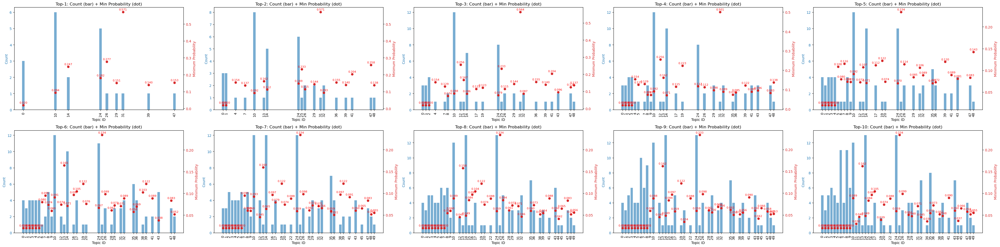

In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 5, figsize=(40, 10))
ax = ax.flatten()  # 2D → 1D로 펴서 접근

top_n_list = sorted(topic_counts_per_n.keys())

for i, top_n in enumerate(top_n_list):
    topic_counts = topic_counts_per_n[top_n]
    topic_minprob = topic_minprob_per_n[top_n]
    topic_ids = sorted(topic_counts.keys())
    counts = [topic_counts[tid] for tid in topic_ids]
    min_probs = [topic_minprob[tid] for tid in topic_ids]

    ax1 = ax[i]
    color = 'tab:blue'
    ax1.bar(topic_ids, counts, color=color, alpha=0.6, label='Count')
    ax1.set_xlabel('Topic ID')
    ax1.set_ylabel('Count', color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_title(f'Top-{top_n}: Count (bar) + Min Probability (dot)')
    ax1.set_xticks(topic_ids)
    ax1.tick_params(axis='x', rotation=90)

    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.plot(topic_ids, min_probs, color=color, marker='o', linestyle='', label='Min Probability', snap=True)
    ax2.set_ylabel('Minimum Probability', color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    for x, y in zip(topic_ids, min_probs):
        ax2.annotate(f'{y:.3f}', (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8, color='red')


plt.tight_layout()
plt.show()

In [ ]:
# 고도화 : 연결된 관계 cnt 값 더해서 토픽과 컨셉 연결하기 (n:1? n:n?)
# 토픽 구성 단어로 문장 예쁘게 생성하기

## Topic10 ~ 100까지 확인


==== Checking for 10 topics ====
Sample topic: (0, '0.018*"반도체" + 0.017*"기업" + 0.017*"기술" + 0.011*"중국" + 0.010*"삼성전자" + 0.009*"개발" + 0.009*"서비스" + 0.008*"산업" + 0.006*"이번" + 0.006*"데이터"')
Top-1: 등장하지 않은 topic 수 = 5 / 10
Top-2: 등장하지 않은 topic 수 = 1 / 10
Top-3: 등장하지 않은 topic 수 = 0 / 10
Top-4: 등장하지 않은 topic 수 = 0 / 10
Top-5: 등장하지 않은 topic 수 = 0 / 10
Top-6: 등장하지 않은 topic 수 = 0 / 10
Top-7: 등장하지 않은 topic 수 = 0 / 10
Top-8: 등장하지 않은 topic 수 = 0 / 10
Top-9: 등장하지 않은 topic 수 = 0 / 10
Top-10: 등장하지 않은 topic 수 = 0 / 10


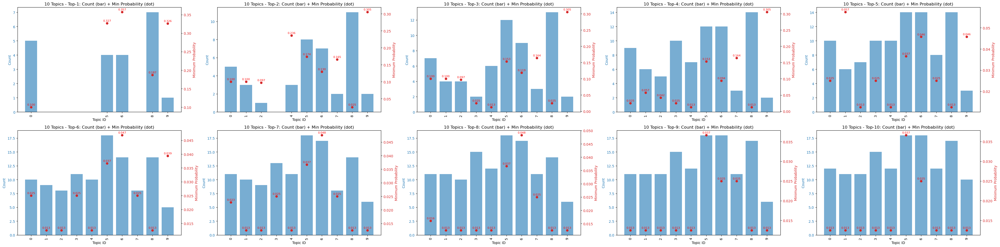


==== Checking for 20 topics ====
Sample topic: (0, '0.026*"기술" + 0.019*"기업" + 0.014*"개발" + 0.011*"산업" + 0.010*"데이터" + 0.008*"활용" + 0.008*"로봇" + 0.008*"서비스" + 0.008*"글로벌" + 0.008*"세계"')
Top-1: 등장하지 않은 topic 수 = 13 / 20
Top-2: 등장하지 않은 topic 수 = 7 / 20
Top-3: 등장하지 않은 topic 수 = 6 / 20
Top-4: 등장하지 않은 topic 수 = 2 / 20
Top-5: 등장하지 않은 topic 수 = 1 / 20
Top-6: 등장하지 않은 topic 수 = 1 / 20
Top-7: 등장하지 않은 topic 수 = 1 / 20
Top-8: 등장하지 않은 topic 수 = 0 / 20
Top-9: 등장하지 않은 topic 수 = 0 / 20
Top-10: 등장하지 않은 topic 수 = 0 / 20


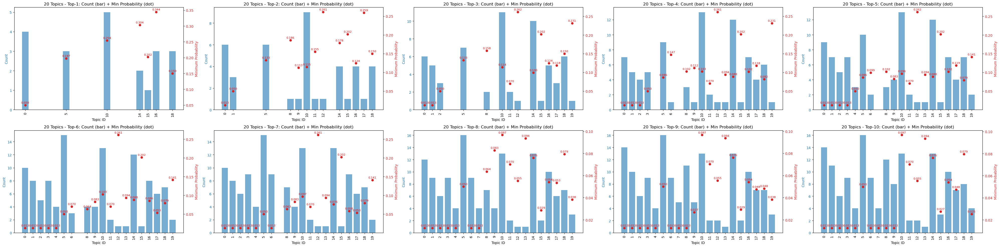


==== Checking for 30 topics ====
Sample topic: (0, '0.031*"기술" + 0.028*"기업" + 0.024*"개발" + 0.014*"바이오" + 0.012*"글로벌" + 0.010*"데이터" + 0.009*"활용" + 0.009*"산업" + 0.009*"사업" + 0.009*"세계"')
Top-1: 등장하지 않은 topic 수 = 20 / 30
Top-2: 등장하지 않은 topic 수 = 15 / 30
Top-3: 등장하지 않은 topic 수 = 11 / 30
Top-4: 등장하지 않은 topic 수 = 5 / 30
Top-5: 등장하지 않은 topic 수 = 3 / 30
Top-6: 등장하지 않은 topic 수 = 1 / 30
Top-7: 등장하지 않은 topic 수 = 1 / 30
Top-8: 등장하지 않은 topic 수 = 1 / 30
Top-9: 등장하지 않은 topic 수 = 2 / 30
Top-10: 등장하지 않은 topic 수 = 1 / 30


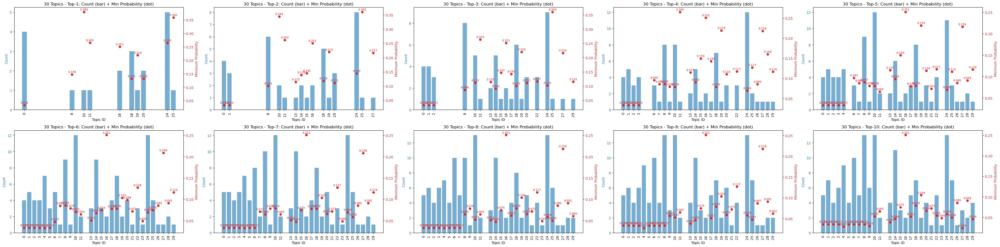


==== Checking for 40 topics ====
Sample topic: (0, '0.030*"기술" + 0.024*"로봇" + 0.019*"제품" + 0.018*"서비스" + 0.016*"기업" + 0.014*"출시" + 0.012*"활용" + 0.012*"전자" + 0.012*"기능" + 0.009*"올해"')
Top-1: 등장하지 않은 topic 수 = 31 / 40
Top-2: 등장하지 않은 topic 수 = 24 / 40
Top-3: 등장하지 않은 topic 수 = 18 / 40
Top-4: 등장하지 않은 topic 수 = 15 / 40
Top-5: 등장하지 않은 topic 수 = 11 / 40
Top-6: 등장하지 않은 topic 수 = 8 / 40
Top-7: 등장하지 않은 topic 수 = 7 / 40
Top-8: 등장하지 않은 topic 수 = 6 / 40
Top-9: 등장하지 않은 topic 수 = 6 / 40
Top-10: 등장하지 않은 topic 수 = 6 / 40


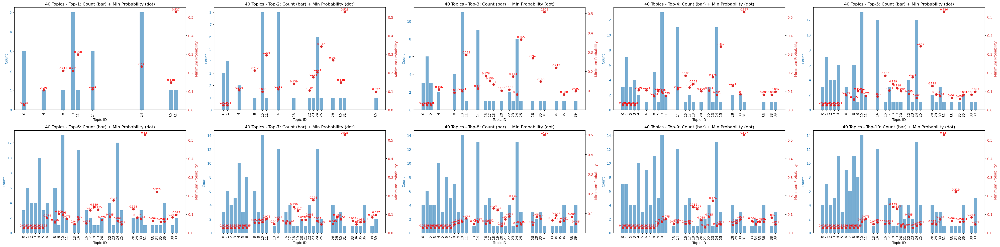


==== Checking for 50 topics ====
Sample topic: (0, '0.039*"기술" + 0.024*"제품" + 0.020*"임상" + 0.020*"의료" + 0.018*"기능" + 0.017*"가전" + 0.016*"환자" + 0.014*"치료" + 0.013*"기기" + 0.013*"질환"')
Top-1: 등장하지 않은 topic 수 = 41 / 50
Top-2: 등장하지 않은 topic 수 = 33 / 50
Top-3: 등장하지 않은 topic 수 = 26 / 50
Top-4: 등장하지 않은 topic 수 = 24 / 50
Top-5: 등장하지 않은 topic 수 = 20 / 50
Top-6: 등장하지 않은 topic 수 = 17 / 50
Top-7: 등장하지 않은 topic 수 = 15 / 50
Top-8: 등장하지 않은 topic 수 = 12 / 50
Top-9: 등장하지 않은 topic 수 = 12 / 50
Top-10: 등장하지 않은 topic 수 = 11 / 50


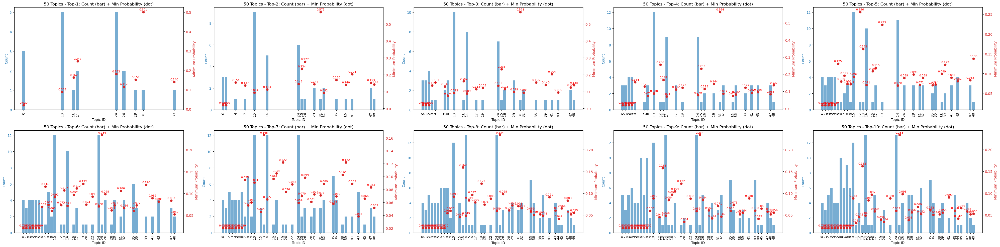


==== Checking for 60 topics ====
Sample topic: (0, '0.020*"서비스" + 0.020*"행사" + 0.018*"올해" + 0.017*"다양" + 0.015*"네이버" + 0.015*"서울" + 0.015*"출시" + 0.015*"세계" + 0.014*"이번" + 0.012*"공간"')
Top-1: 등장하지 않은 topic 수 = 49 / 60
Top-2: 등장하지 않은 topic 수 = 43 / 60
Top-3: 등장하지 않은 topic 수 = 35 / 60
Top-4: 등장하지 않은 topic 수 = 32 / 60
Top-5: 등장하지 않은 topic 수 = 32 / 60
Top-6: 등장하지 않은 topic 수 = 26 / 60
Top-7: 등장하지 않은 topic 수 = 21 / 60
Top-8: 등장하지 않은 topic 수 = 19 / 60
Top-9: 등장하지 않은 topic 수 = 16 / 60
Top-10: 등장하지 않은 topic 수 = 16 / 60


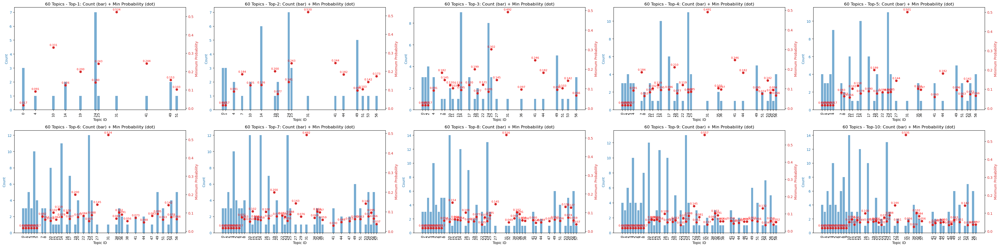


==== Checking for 70 topics ====
Sample topic: (0, '0.071*"서비스" + 0.025*"통신" + 0.023*"제공" + 0.018*"출시" + 0.016*"활용" + 0.016*"기능" + 0.015*"고객" + 0.013*"기술" + 0.011*"이동" + 0.011*"생성"')
Top-1: 등장하지 않은 topic 수 = 56 / 70
Top-2: 등장하지 않은 topic 수 = 48 / 70
Top-3: 등장하지 않은 topic 수 = 43 / 70
Top-4: 등장하지 않은 topic 수 = 38 / 70
Top-5: 등장하지 않은 topic 수 = 34 / 70
Top-6: 등장하지 않은 topic 수 = 32 / 70
Top-7: 등장하지 않은 topic 수 = 28 / 70
Top-8: 등장하지 않은 topic 수 = 27 / 70
Top-9: 등장하지 않은 topic 수 = 27 / 70
Top-10: 등장하지 않은 topic 수 = 25 / 70


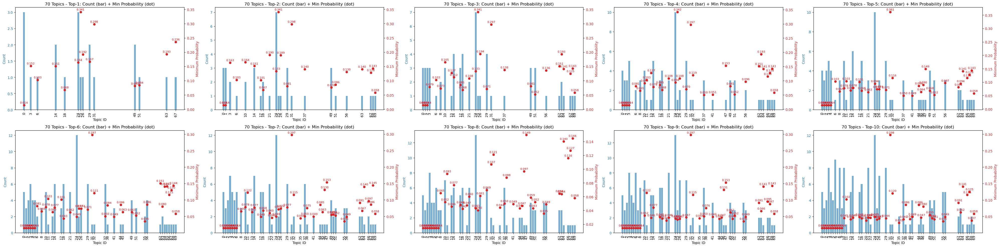


==== Checking for 80 topics ====
Sample topic: (0, '0.077*"서비스" + 0.028*"통신" + 0.027*"기술" + 0.022*"출시" + 0.020*"제공" + 0.016*"올해" + 0.013*"다양" + 0.013*"기능" + 0.012*"제품" + 0.012*"이용"')
Top-1: 등장하지 않은 topic 수 = 68 / 80
Top-2: 등장하지 않은 topic 수 = 61 / 80
Top-3: 등장하지 않은 topic 수 = 58 / 80
Top-4: 등장하지 않은 topic 수 = 48 / 80
Top-5: 등장하지 않은 topic 수 = 44 / 80
Top-6: 등장하지 않은 topic 수 = 39 / 80
Top-7: 등장하지 않은 topic 수 = 35 / 80
Top-8: 등장하지 않은 topic 수 = 31 / 80
Top-9: 등장하지 않은 topic 수 = 29 / 80
Top-10: 등장하지 않은 topic 수 = 28 / 80


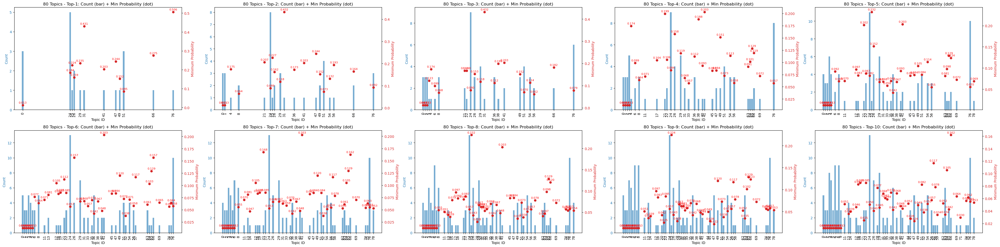


==== Checking for 90 topics ====
Sample topic: (0, '0.197*"서비스" + 0.058*"고객" + 0.041*"제공" + 0.040*"이용" + 0.038*"이용자" + 0.030*"인도네시아" + 0.019*"확장" + 0.018*"사업" + 0.018*"상공인" + 0.016*"스타"')
Top-1: 등장하지 않은 topic 수 = 78 / 90
Top-2: 등장하지 않은 topic 수 = 70 / 90
Top-3: 등장하지 않은 topic 수 = 62 / 90
Top-4: 등장하지 않은 topic 수 = 55 / 90
Top-5: 등장하지 않은 topic 수 = 47 / 90
Top-6: 등장하지 않은 topic 수 = 46 / 90
Top-7: 등장하지 않은 topic 수 = 40 / 90
Top-8: 등장하지 않은 topic 수 = 37 / 90
Top-9: 등장하지 않은 topic 수 = 35 / 90
Top-10: 등장하지 않은 topic 수 = 29 / 90


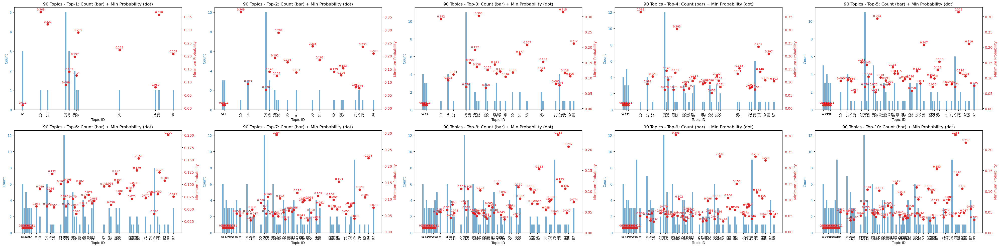


==== Checking for 100 topics ====
Sample topic: (0, '0.072*"맥주" + 0.057*"클라우드" + 0.048*"음료" + 0.039*"설계" + 0.032*"경쟁" + 0.029*"입찰" + 0.027*"주류" + 0.025*"사업" + 0.023*"마케팅" + 0.021*"제품"')
Top-1: 등장하지 않은 topic 수 = 89 / 100
Top-2: 등장하지 않은 topic 수 = 82 / 100
Top-3: 등장하지 않은 topic 수 = 73 / 100
Top-4: 등장하지 않은 topic 수 = 66 / 100
Top-5: 등장하지 않은 topic 수 = 62 / 100
Top-6: 등장하지 않은 topic 수 = 56 / 100
Top-7: 등장하지 않은 topic 수 = 55 / 100
Top-8: 등장하지 않은 topic 수 = 47 / 100
Top-9: 등장하지 않은 topic 수 = 49 / 100
Top-10: 등장하지 않은 topic 수 = 46 / 100


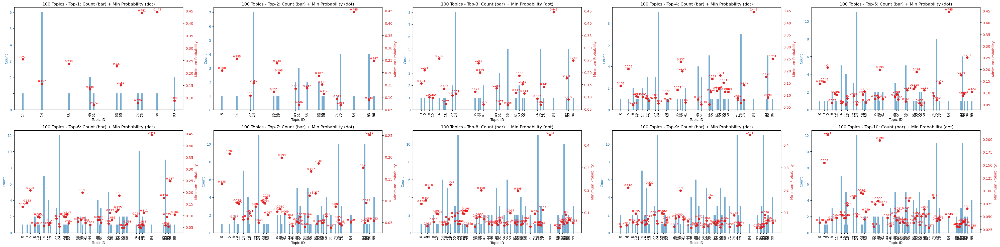

In [ ]:
from collections import defaultdict
import matplotlib.pyplot as plt
from gensim.models import LdaModel
from gensim.test.utils import datapath
from gensim.corpora import Dictionary

# 분석할 토픽 개수 범위
for num_topic in range(10, 101, 10):
    print(f"\n==== Checking for {num_topic} topics ====")

    # LDA 모델 Load
    temp_file = datapath(f"/home/eunhyea/EARTH/ConceptMap/topic/LDAmodel/topic{num_topic}/LDA{num_topic}")
    lda = LdaModel.load(temp_file)

    # Dictionary Load
    common_dictionary = Dictionary.load(f"/home/eunhyea/EARTH/ConceptMap/topic/LDAmodel/topic{num_topic}/LDA{num_topic}.id2word")

    # 토픽 리스트 (확인용)
    topicList = lda.print_topics(num_words=10, num_topics=num_topic)
    # print(f"Sample topic: {topicList[0]}")

    # Top-1 ~ Top-10까지 확인
    max_top_n = 10
    topic_counts_per_n = defaultdict(lambda: defaultdict(int))
    topic_minprob_per_n = defaultdict(lambda: defaultdict(lambda: float('inf')))

    all_appeared_topic_ids = set()

    for top_n in range(1, max_top_n + 1):
        temp_topic_count = defaultdict(int)
        temp_topic_minprob = defaultdict(lambda: float('inf'))
        appeared_topic_ids = set()

        for dic in concept_docs:
            for concept_name, sub_terms in dic.items():
                bow = common_dictionary.doc2bow(sub_terms)
                topic_vector = lda.get_document_topics(bow)
                sorted_topics = sorted(topic_vector, key=lambda x: x[1], reverse=True)
                top_topics = sorted_topics[:top_n]

                for topic_id, prob in top_topics:
                    temp_topic_count[topic_id] += 1
                    appeared_topic_ids.add(topic_id)
                    if prob < temp_topic_minprob[topic_id]:
                        temp_topic_minprob[topic_id] = prob

        topic_counts_per_n[top_n] = dict(temp_topic_count)
        topic_minprob_per_n[top_n] = dict(temp_topic_minprob)
        all_appeared_topic_ids.update(appeared_topic_ids)

        # 등장하지 않은 토픽 개수 출력
        tot_topic_id = {i for i in range(num_topic)}
        missing_topic_ids = tot_topic_id - appeared_topic_ids
        print(f"Top-{top_n}: 등장하지 않은 topic 수 = {len(missing_topic_ids)} / {num_topic}")

    # --------------------
    # 시각화
    # --------------------
    fig, ax = plt.subplots(2, 5, figsize=(40, 10))
    ax = ax.flatten()

    top_n_list = sorted(topic_counts_per_n.keys())

    for i, top_n in enumerate(top_n_list):
        topic_counts = topic_counts_per_n[top_n]
        topic_minprob = topic_minprob_per_n[top_n]
        topic_ids = sorted(topic_counts.keys())
        counts = [topic_counts[tid] for tid in topic_ids]
        min_probs = [topic_minprob[tid] for tid in topic_ids]

        ax1 = ax[i]
        color = 'tab:blue'
        ax1.bar(topic_ids, counts, color=color, alpha=0.6, label='Count')
        ax1.set_xlabel('Topic ID')
        ax1.set_ylabel('Count', color=color)
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title(f'{num_topic} Topics - Top-{top_n}: Count (bar) + Min Probability (dot)')
        ax1.set_xticks(topic_ids)
        ax1.tick_params(axis='x', rotation=90)

        ax2 = ax1.twinx()
        color = 'tab:red'
        ax2.plot(topic_ids, min_probs, color=color, marker='o', linestyle='', label='Min Probability', snap=True)
        ax2.set_ylabel('Minimum Probability', color=color)
        ax2.tick_params(axis='y', labelcolor=color)
        for x, y in zip(topic_ids, min_probs):
            ax2.annotate(f'{y:.3f}', (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=8, color='red')

    plt.tight_layout()
    plt.show()

## relation cnt 포함해서 다시

In [1]:
# neo4j 연결해서 컨셉 가져오기
from neo4j import GraphDatabase
import ast

# URI examples: "neo4j://localhost", "neo4j+s://xxx.databases.neo4j.io"
URI = "neo4j://regularmark.iptime.org:37687"
AUTH = ("neo4j", "wlrnek123@")

with GraphDatabase.driver(URI, auth=AUTH) as driver:
    driver.verify_connectivity()

    query = '''
    MATCH (sup:Concept_lv2)-[r]->(sub:Concept_sub)

    WHERE type(r) IN ['superOrdinateOf', '_RELATED']
    WITH sup, collect(DISTINCT [sub.name, r.cnt]) AS sub_tuples
    RETURN sup.name AS name,
        sup.synonyms AS synonyms,
        sub_tuples'''

    concept_kws = driver.execute_query(query,
        database_="neo4j",
    )
len(concept_kws.records),concept_kws.records # sub_tuples=[['연결된 용어','연결 횟수'], ...]

(21,
 [<Record name='경제모형' synonyms="['경제모형', '경제 모형']" sub_tuples=[['기울기', 1], ['미시', 1], ['노하우', 2], ['인 플레이', 7], ['실질수익률채', 2], ['금융', 6], ['경제 성장', 4], ['시장', 26], ['재화', 10], ['공급', 26], ['고전학파', 5], ['자본', 3], ['소득', 15], ['균형', 21], ['인플레', 7], ['경제정책', 7], ['실업', 2], ['인플레이션', 7], ['외국환시세', 17], ['국민', 10], ['이자율', 2], ['거시 경제학', 4], ['경쟁', 6], ['국민소득', 10], ['경제 이론', 2], ['AIO분석', 2], ['생산', 7], ['수요', 24], ['개방 경제', 19], ['재정', 11], ['경제학', 67], ['거시 경제', 17], ['자원', 1], ['총수요곡선', 5], ['선형 모형', 1], ['경쟁 시장', 1], ['단기금융시장', 1], ['방화', 1], ['RA', 1], ['에이티에스', 1], ['유족 급여', 1], ['물류 회사', 1], ['물류', 1], ['닷컴기업', 1], ['닷컴', 1], ['금융 상품', 1], ['케인스', 1], ['내생적 성장이론(Endogenous Growth Theory)', 1], ['Rho(로)', 1], ['우모', 1], ['목표 인플레이션율', 1], ['인플레이션율', 1], ['단기 균형', 1], ['우상향', 1], ['장기 총공급 곡선', 1], ['LA', 1], ['화폐수량설', 1], ['금융정책', 1], ['LM곡선', 1], ['재정환율', 1], ['한계수입생산물', 1], ['한계생산물', 1], ['생산력', 1], ['경제체제', 1], ['경제 문제', 1], ['디스인플레이션', 1], ['디플레이션', 1], ['계속성의 원칙', 1], ['연방준비

# 토픽 프롬트트

In [ ]:
## 본인의 openai api 키 입력
OPENAI_API_KEY = '알고싶으면 500원'
organization_id = ''
project_id = ''

In [44]:
from openai import OpenAI
import os
import time

#client 생성 (OpenAI 모듈로 생성된 인스턴스)
client = OpenAI(api_key= OPENAI_API_KEY,
                organization=organization_id,
                project=project_id
                )

In [45]:
def set_open_params(
    model="gpt-4.1-nano",
    temperature=0.2,
    max_tokens=20,
    top_p=1,
    frequency_penalty=0,
    presence_penalty=0,
):
    """ set openai parameters"""

    openai_params = {}

    openai_params['model'] = model
    openai_params['temperature'] = temperature
    openai_params['max_tokens'] = max_tokens
    openai_params['top_p'] = top_p
    openai_params['frequency_penalty'] = frequency_penalty
    openai_params['presence_penalty'] = presence_penalty
    return openai_params

In [ ]:
# --- 제약 조건 포함 프롬프트 작성 ---
params = set_open_params()

system_message_content = """You are an expert in economic and industrial analysis writing.

Given a topic represented by a list of key terms (mostly nouns),
write one clear, concise, and professional summary sentence
that captures the economic or industrial concept underlying the topic.
"""

prompt_text_with_constraints = """
The tone should match that of economic reports, analyst briefings, or business news articles,
focusing on core trends, dynamics, or market impacts.

Example input:
["technology", "company", "development", "industry", "data", "application", "robot", "service", "global", "world"]

Expected output:
The global technology sector is enhancing its industrial competitiveness through data-driven innovations, robotics, and advanced services, seeking to expand its presence in international markets.

Make sure the sentence is structured, precise, and economically insightful.
"""
model_output = client.responses.create(params, system_message_content, prompt_text_with_constraints, verbose=True)

# 간단한 제약 조건 검증 (코드에서 모든 제약을 완벽히 검증하기는 어려울 수 있습니다)
is_within_length = len(model_output) <= 30
has_keyword1 = "스마트" in model_output
has_keyword2 = "시간" in model_output
has_keyword3 = "디자인" in model_output
no_price_mention = "가격" not in model_output and "원" not in model_output # 간단한 가격 언급 체크

print("\n--- 제약 조건 검증 ---")
print(f"30자 이내 만족: {is_within_length} (현재 길이: {len(model_output)}자)")
print(f"'스마트' 포함: {has_keyword1}")
print(f"'시간' 포함: {has_keyword2}")
print(f"'디자인' 포함: {has_keyword3}")
print(f"가격 언급 없음: {no_price_mention}") # 주의: 완벽한 검증은 아님

# 경제 보고서 PDF

In [ ]:
import os
import requests
from bs4 import BeautifulSoup
from urllib.parse import urljoin, unquote
import time

# —– 설정 부분 —–
BASE_URL = "https://www.kdi.re.kr"
# 토픽 리스트 URL (페이지 번호만 바꿔서 순회)
LIST_URL = (
    "https://www.kdi.re.kr/research/topicList"
    "?cd={subject}&pg={page}"
    # "&sub=A00&sub=A02&sub=A01&sub=A03&sub=A04"
    # "&sub=A05&sub=A06&sub=A07&sub=A08&sub=A09&sub=A99"
    "&nm=&year=&pp=10"
)
HEADERS = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/114.0.0.0 Safari/537.36"
}
OUTDIR = "kdi_pdfs"

os.makedirs(OUTDIR, exist_ok=True)
session = requests.Session()
session.headers.update(HEADERS)
session.verify = False   # ← SSL 인증서 검증 끄기


def scrape_page(subject, page):
    """ 한 페이지에서 <button class="i02"> 요소들을 찾아 다운로드 """
    url = LIST_URL.format(subject=subject, page=page)
    r = session.get(url)
    r.raise_for_status()
    soup = BeautifulSoup(r.text, "html.parser")

    # 각 아이템(<li>)마다
    for li in soup.select("li"):
        # 제목 텍스트
        title_tag = li.select_one(".rpt_tit > strong")
        title = title_tag.get_text(strip=True) if title_tag else f"page{page}"
        # 다운로드 버튼
        btn = li.select_one("button.i02")
        if not btn or "onclick" not in btn.attrs:
            continue

        # onclick="location.href='/file/download?atch_no=....'"
        href = btn["onclick"]
        # 간단 파싱
        if "location.href=" not in href:
            continue
        relpath = href.split("location.href=")[1].strip(" '\";")
        download_url = urljoin(BASE_URL, relpath)

        # 파일 이름: 한글 제목+atch_no, 혹은 atch_no만
        atch_no = relpath.split("atch_no=")[-1]
        # URL 디코딩
        atch_no = unquote(atch_no)
        safe_title = "".join(c for c in title if c.isalnum() or c in " _-")[:50]
        # fname = f"{safe_title}_{atch_no}.pdf"
        fname = f"{safe_title}.pdf"
        path = os.path.join(OUTDIR, fname)

        if os.path.exists(path):
            print(f"✔ 이미 다운로드됨: {fname}")
            continue

        # 실제 다운로드
        print(f"↓ Downloading {fname} ...")
        resp = session.get(download_url, stream=True)
        resp.raise_for_status()
        with open(path, "wb") as fw:
            for chunk in resp.iter_content(1024 * 8):
                fw.write(chunk)
        print(f"  → 저장 완료: {path}")
        time.sleep(0.2)

if __name__ == "__main__":
    # 예시: 1~5 페이지를 돌리고 싶다면 range(1,6)
    for sub in ['A','B','C','D','E','F','G','H','I']:
        for pg in range(1, 3):
            print(f"\n=== page {pg} ===")
            scrape_page(sub, pg)



=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading KDI 경제전망 2025 상반기.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제전망 2025 상반기.pdf
↓ Downloading KDI 경제동향 2025 5.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2025 5.pdf
↓ Downloading 소득지원정책의 거시경제적 영향 분석을 위한 거시경제모형 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/소득지원정책의 거시경제적 영향 분석을 위한 거시경제모형 연구.pdf
↓ Downloading KDI 경제동향 2025 4.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2025 4.pdf
↓ Downloading KDI 경제동향 2025 3.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2025 3.pdf
↓ Downloading KDI Journal of Economic Policy February 2025.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI Journal of Economic Policy February 2025.pdf
↓ Downloading KDI 경제전망  수정  2025년 2월.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제전망  수정  2025년 2월.pdf
↓ Downloading KDI 경제동향 2025 2.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2025 2.pdf
↓ Downloading KDI 경제동향 2025 1.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2025 1.pdf
↓ Downloading 한국 경제 특수성을 반영한 거시재정모형에 대한 고찰.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/한국 경제 특수성을 반영한 거시재정모형에 대한 고찰.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 이전지출과 누진적 소득세의 정책효과 분석.pdf ...
  → 저장 완료: kdi_pdfs/이전지출과 누진적 소득세의 정책효과 분석.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading KDI 경제동향 2024 12.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2024 12.pdf
↓ Downloading KDI Journal of Economic Policy November 2024.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI Journal of Economic Policy November 2024.pdf
↓ Downloading 경제안전보장과 공급망 강화 전략 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/경제안전보장과 공급망 강화 전략 연구.pdf
↓ Downloading KDI 경제전망 2024 하반기.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제전망 2024 하반기.pdf
↓ Downloading KDI 경제동향 2024 11.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2024 11.pdf
↓ Downloading 경제사회구조 변화를 고려한 거시경제모형 체계 구축.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/경제사회구조 변화를 고려한 거시경제모형 체계 구축.pdf
↓ Downloading KDI 경제동향 2024 10.pdf ...
  → 저장 완료: kdi_pdfs/KDI 경제동향 2024 10.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading KDI 경제동향 2024 9.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI 경제동향 2024 9.pdf
↓ Downloading KDI Journal of Economic Policy August 2024.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/KDI Journal of Economic Policy August 2024.pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 금융의 혁신과 경쟁촉진을 위한 중장기 전략 연구 CBDC 기반 은행산업 구조개편의 효과와 .pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/금융의 혁신과 경쟁촉진을 위한 중장기 전략 연구 CBDC 기반 은행산업 구조개편의 효과와 .pdf
↓ Downloading 주택시장과 규제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/주택시장과 규제.pdf
↓ Downloading Protecting Customer Funds for Emerging Financial P.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Protecting Customer Funds for Emerging Financial P.pdf
↓ Downloading 신종 금융상품의 고객자금 보호방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/신종 금융상품의 고객자금 보호방안.pdf
↓ Downloading 부동산 자산시장 균형 조건과 기대인플레이션 결정요인 분석.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/부동산 자산시장 균형 조건과 기대인플레이션 결정요인 분석.pdf
↓ Downloading 거시경제금융시장 환경변화에 대응한 외환정책 방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/거시경제금융시장 환경변화에 대응한 외환정책 방향.pdf
↓ Downloading 주택시장의 규제와 주택공급방식의 방향 LTV DSR 보유과세 그리고 선분양방식의 개선을 중.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/주택시장의 규제와 주택공급방식의 방향 LTV DSR 보유과세 그리고 선분양방식의 개선을 중.pdf
↓ Downloading 디지털 전환에 따른 금융의 혁신과 개혁 방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/디지털 전환에 따른 금융의 혁신과 개혁 방안.pdf
↓ Downloading 개인사업자 대상 경영교육컨설팅 지원정책의 효과분석과 시사점.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/개인사업자 대상 경영교육컨설팅 지원정책의 효과분석과 시사점.pdf
↓ Downloading 갈라파고스적 부동산PF 근본적 구조개선 필요.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/갈라파고스적 부동산PF 근본적 구조개선 필요.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Galapagos Syndrome in South Koreas Real Estate PF .pdf ...
  → 저장 완료: kdi_pdfs/Galapagos Syndrome in South Koreas Real Estate PF .pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 전세보증금 반환보증제도 개선방안.pdf ...
  → 저장 완료: kdi_pdfs/전세보증금 반환보증제도 개선방안.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Strategies for Refining the Jeonse Deposit Return .pdf ...
  → 저장 완료: kdi_pdfs/Strategies for Refining the Jeonse Deposit Return .pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 가계대출규제의 규제영향분석에 관한 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/가계대출규제의 규제영향분석에 관한 연구.pdf
↓ Downloading Global Issue Brief 2022년 07월 창간호  글로벌 복합 위기와 세계 경제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2022년 07월 창간호  글로벌 복합 위기와 세계 경제.pdf
↓ Downloading Global Issue Brief 2023년 02월호  세계화의 재구성.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2023년 02월호  세계화의 재구성.pdf
↓ Downloading Global Issue Brief 2022년 10월호  글로벌 연금개혁 동향과 시사점.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2022년 10월호  글로벌 연금개혁 동향과 시사점.pdf
↓ Downloading Global Issue Brief 2022년 08월호.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2022년 08월호.pdf
↓ Downloading Global Issue Brief 2022년 12월호  2023 글로벌 이슈 전망.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2022년 12월호  2023 글로벌 이슈 전망.pdf
↓ Downloading Global Issue Brief 2023년 01월호  인공지능AI의 사회경제적 영향과 대.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2023년 01월호  인공지능AI의 사회경제적 영향과 대.pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading K-콘텐츠의 비상飛上 산업 특성과 성장 요인 분석.pdf ...
  → 저장 완료: kdi_pdfs/K-콘텐츠의 비상飛上 산업 특성과 성장 요인 분석.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: 금융의 혁신과 경쟁촉진을 위한 중장기 전략 연구 CBDC 기반 은행산업 구조개편의 효과와 .pdf
↓ Downloading 경쟁활성화 정책 사후영향평가.pdf ...
  → 저장 완료: kdi_pdfs/경쟁활성화 정책 사후영향평가.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 서비스 경제 관련 현안 연구.pdf ...
  → 저장 완료: kdi_pdfs/서비스 경제 관련 현안 연구.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading K-콘텐츠 산업의 시장구조분석 및 경쟁력 강화 방안 연구 웹툰산업을 중심으로.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/K-콘텐츠 산업의 시장구조분석 및 경쟁력 강화 방안 연구 웹툰산업을 중심으로.pdf
↓ Downloading Path to National Champions Transforming Support Po.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Path to National Champions Transforming Support Po.pdf
↓ Downloading 대리점거래 실태분석과 정책방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/대리점거래 실태분석과 정책방향.pdf
✔ 이미 다운로드됨: Protecting Customer Funds for Emerging Financial P.pdf
✔ 이미 다운로드됨: 신종 금융상품의 고객자금 보호방안.pdf
↓ Downloading 디지털 플랫폼 경제의 경쟁정책.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/디지털 플랫폼 경제의 경쟁정책.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 온라인 플랫폼의 자사우대에 대한 경쟁정책 방향.pdf ...
  → 저장 완료: kdi_pdfs/온라인 플랫폼의 자사우대에 대한 경쟁정책 방향.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Competition Policy for Online Platforms Self-Prefe.pdf ...
  → 저장 완료: kdi_pdfs/Competition Policy for Online Platforms Self-Prefe.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 저탄소경제 전환 전략과 정책과제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/저탄소경제 전환 전략과 정책과제.pdf
↓ Downloading 온라인 플랫폼에서의 정보 제공과 소비자 보호에 관한 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/온라인 플랫폼에서의 정보 제공과 소비자 보호에 관한 연구.pdf
↓ Downloading 지속가능개발목표SDGs 실현을 위한 ESG 무역을 위한 원조AfT의 역할 및 정책과제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/지속가능개발목표SDGs 실현을 위한 ESG 무역을 위한 원조AfT의 역할 및 정책과제.pdf
↓ Downloading ESG 실현을 위한 공공 거버넌스와 역할.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/ESG 실현을 위한 공공 거버넌스와 역할.pdf
↓ Downloading 국제개발협력의 ESG 가이드라인 정책연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/국제개발협력의 ESG 가이드라인 정책연구.pdf
↓ Downloading 시장구조조사 2021년 기준.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/시장구조조사 2021년 기준.pdf
✔ 이미 다운로드됨: 전세보증금 반환보증제도 개선방안.pdf
✔ 이미 다운로드됨: Strategies for Refining the Jeonse Deposit Return .pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 규제품질 제고를 위한 이해관계자 의견수렴 제도 개선방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/규제품질 제고를 위한 이해관계자 의견수렴 제도 개선방안.pdf
✔ 이미 다운로드됨: 경쟁활성화 정책 사후영향평가.pdf
✔ 이미 다운로드됨: 주택시장과 규제.pdf
↓ Downloading AI Regulation for Enhancing Competitiveness in the.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/AI Regulation for Enhancing Competitiveness in the.pdf
↓ Downloading 화학물질 등록 및 평가 규제 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/화학물질 등록 및 평가 규제 연구.pdf
↓ Downloading 디지털 전환에 따른 전문서비스업 현황과 과제 법률서비스업을 중심으로.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/디지털 전환에 따른 전문서비스업 현황과 과제 법률서비스업을 중심으로.pdf
↓ Downloading 규제체계와 규제영향분석의 주요국 제도 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/규제체계와 규제영향분석의 주요국 제도 연구.pdf
↓ Downloading 디지털 치료기기 관련 규제 현황과 과제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/디지털 치료기기 관련 규제 현황과 과제.pdf
↓ Downloading 국내외 플라스틱 관련 규제 이슈 및 탈脫플라스틱을 위한 제도 개선방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/국내외 플라스틱 관련 규제 이슈 및 탈脫플라스틱을 위한 제도 개선방안.pdf
✔ 이미 다운로드됨: 가계대출규제의 규제영향분석에 관한 연구.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Restructuring Platform Merger Review.pdf ...
  → 저장 완료: kdi_pdfs/Restructuring Platform Merger Review.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 플랫폼 기업결합 심사 개선방향.pdf ...
  → 저장 완료: kdi_pdfs/플랫폼 기업결합 심사 개선방향.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 규제사후영향평가를 위한 주요국 사례 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/규제사후영향평가를 위한 주요국 사례 연구.pdf
↓ Downloading 스타트업 생태계 구축과 규제환경에 대한 연구.pdf ...
  → 저장 완료: kdi_pdfs/스타트업 생태계 구축과 규제환경에 대한 연구.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 바이오신소재 규제이슈 연구I 배양육.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/바이오신소재 규제이슈 연구I 배양육.pdf
↓ Downloading 온실가스 감축정책이 제조업 경쟁력에 미치는 영향.pdf ...
  → 저장 완료: kdi_pdfs/온실가스 감축정책이 제조업 경쟁력에 미치는 영향.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Impacts of Climate Policies on Industrial Competit.pdf ...
  → 저장 완료: kdi_pdfs/Impacts of Climate Policies on Industrial Competit.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 납품단가 연동제에 대한 경제학적 논의.pdf ...
  → 저장 완료: kdi_pdfs/납품단가 연동제에 대한 경제학적 논의.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 디지털 지급결제 시장의 개방이 금융소비자에게 미치는 영향과 정책과제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/디지털 지급결제 시장의 개방이 금융소비자에게 미치는 영향과 정책과제.pdf
↓ Downloading 중소기업 적합업종제도의 경제적 효과와 정책방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/중소기업 적합업종제도의 경제적 효과와 정책방향.pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 장애인의 사회통합과 자립을 도모하기 위한 고용지원 정책방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/장애인의 사회통합과 자립을 도모하기 위한 고용지원 정책방향.pdf
↓ Downloading 효율적인 고령 인력 활용 방안에 대한 연구 직무 분석을 중심으로.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/효율적인 고령 인력 활용 방안에 대한 연구 직무 분석을 중심으로.pdf
↓ Downloading 한국의 인구변동과 인플레이션.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/한국의 인구변동과 인플레이션.pdf
↓ Downloading 인공지능으로 인한 노동시장의 변화와 정책방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/인공지능으로 인한 노동시장의 변화와 정책방향.pdf
↓ Downloading 일-가정 양립을 위한 근로환경.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/일-가정 양립을 위한 근로환경.pdf
✔ 이미 다운로드됨: 저탄소경제 전환 전략과 정책과제.pdf
↓ Downloading 코로나19 전후 고용구조 및 소득격차 변화 노동패널 분기자료를 활용한 분석.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/코로나19 전후 고용구조 및 소득격차 변화 노동패널 분기자료를 활용한 분석.pdf
↓ Downloading 외환위기 시기 비자발적 실직 경험의 중장기적 영향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/외환위기 시기 비자발적 실직 경험의 중장기적 영향.pdf
↓ Downloading Middle-aged and Older Workers in the Korean Labor .pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Middle-aged and Older Workers in the Korean Labor .pdf
↓ Downloading 직무 분석을 통해 살펴본 중장년 노동시장의 현황과 개선 방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/직무 분석을 통해 살펴본 중장년 노동시장의 현황과 개선 방안.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 여성의 경력단절 우려와 출산율 감소.pdf ...
  → 저장 완료: kdi_pdfs/여성의 경력단절 우려와 출산율 감소.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Womens Career Interruptions and the Declining Fert.pdf ...
  → 저장 완료: kdi_pdfs/Womens Career Interruptions and the Declining Fert.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 중장년층 고용 불안정성 극복을 위한 노동시장 기능 회복 방안.pdf ...
  → 저장 완료: kdi_pdfs/중장년층 고용 불안정성 극복을 위한 노동시장 기능 회복 방안.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Restoring Labor Market Functions to Address Job In.pdf ...
  → 저장 완료: kdi_pdfs/Restoring Labor Market Functions to Address Job In.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 인구정책 성과 평가체계 개편방안 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/인구정책 성과 평가체계 개편방안 연구.pdf
↓ Downloading 노동시장 변화와 대응방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/노동시장 변화와 대응방향.pdf
↓ Downloading 고령화 시대에 대응한 교육-훈련 분야 개편방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/고령화 시대에 대응한 교육-훈련 분야 개편방향.pdf
↓ Downloading OECD 연간근로시간 비교분석과 시사점.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/OECD 연간근로시간 비교분석과 시사점.pdf
↓ Downloading OECD Average Annual Hours Worked Comparative Analy.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/OECD Average Annual Hours Worked Comparative Analy.pdf
↓ Downloading 소득과 자산으로 진단한 노인빈곤과 정책방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/소득과 자산으로 진단한 노인빈곤과 정책방향.pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 교사 전문성 및 학습지원 제고를 통한 초등교육의 개선.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/교사 전문성 및 학습지원 제고를 통한 초등교육의 개선.pdf
↓ Downloading 지역대학의 구조적 전환과 발전 방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/지역대학의 구조적 전환과 발전 방안.pdf
↓ Downloading 유보통합 정착을 위한 교사 재교육 방안 교사학습공동체를 중심으로.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/유보통합 정착을 위한 교사 재교육 방안 교사학습공동체를 중심으로.pdf
↓ Downloading 교육혁신과 인적자본 형성에 관한 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/교육혁신과 인적자본 형성에 관한 연구.pdf
✔ 이미 다운로드됨: 외환위기 시기 비자발적 실직 경험의 중장기적 영향.pdf
✔ 이미 다운로드됨: 여성의 경력단절 우려와 출산율 감소.pdf
✔ 이미 다운로드됨: Womens Career Interruptions and the Declining Fert.pdf
↓ Downloading 한국 경제교육의 변천사.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/한국 경제교육의 변천사.pdf
✔ 이미 다운로드됨: 고령화 시대에 대응한 교육-훈련 분야 개편방향.pdf
↓ Downloading 수요자 중심의 대학 구조개혁.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/수요자 중심의 대학 구조개혁.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Restructuring Higher Education Toward a Student-le.pdf ...
  → 저장 완료: kdi_pdfs/Restructuring Higher Education Toward a Student-le.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: Global Issue Brief 2022년 07월 창간호  글로벌 복합 위기와 세계 경제.pdf
✔ 이미 다운로드됨: Global Issue Brief 2023년 02월호  세계화의 재구성.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 10월호  글로벌 연금개혁 동향과 시사점.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 08월호.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 12월호  2023 글로벌 이슈 전망.pdf
✔ 이미 다운로드됨: Global Issue Brief 2023년 01월호  인공지능AI의 사회경제적 영향과 대.pdf
↓ Downloading Global Issue Brief 2023년 03월호  글로벌 불평등 시대의 난민과 이민자.pdf ...
  → 저장 완료: kdi_pdfs/Global Issue Brief 2023년 03월호  글로벌 불평등 시대의 난민과 이민자.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Global Issue Brief 2022년 09월호  글로벌 인플레이션 이슈와 진단.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Global Issue Brief 2022년 09월호  글로벌 인플레이션 이슈와 진단.pdf
↓ Downloading 대학 구조개혁에 관한 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/대학 구조개혁에 관한 연구.pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 공급망 안정화를 위한 국제개발협력의 역할 및 방향 기술협력을 중심으로.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/공급망 안정화를 위한 국제개발협력의 역할 및 방향 기술협력을 중심으로.pdf
↓ Downloading 보건의료 마이데이터 활성화를 위한 제언 해외 사례와 대국민 설문조사의 시사점.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/보건의료 마이데이터 활성화를 위한 제언 해외 사례와 대국민 설문조사의 시사점.pdf
✔ 이미 다운로드됨: K-콘텐츠의 비상飛上 산업 특성과 성장 요인 분석.pdf
↓ Downloading 지역 혁신 클러스터 확충방안 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/지역 혁신 클러스터 확충방안 연구.pdf
↓ Downloading 개발도상국 혁신역량 제고를 위한 지식공유사업의 역할 및 과제.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/개발도상국 혁신역량 제고를 위한 지식공유사업의 역할 및 과제.pdf
↓ Downloading 미래기술 산업생태계 연구 인공지능기술과 산업.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/미래기술 산업생태계 연구 인공지능기술과 산업.pdf
↓ Downloading 미래기술 산업생태계 연구 우주기술과 산업.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/미래기술 산업생태계 연구 우주기술과 산업.pdf
↓ Downloading 뉴노멀 시대에 국제개발협력  환경에너지 편.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/뉴노멀 시대에 국제개발협력  환경에너지 편.pdf
↓ Downloading 개발도상국 개발금융 역량강화 체계화 및 지식공유 고도화 방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/개발도상국 개발금융 역량강화 체계화 및 지식공유 고도화 방안.pdf
↓ Downloading 한국평가데이터KoDATA DB 구축 및 활용방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/한국평가데이터KoDATA DB 구축 및 활용방안.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: 서비스 경제 관련 현안 연구.pdf
✔ 이미 다운로드됨: K-콘텐츠 산업의 시장구조분석 및 경쟁력 강화 방안 연구 웹툰산업을 중심으로.pdf
✔ 이미 다운로드됨: Path to National Champions Transforming Support Po.pdf
↓ Downloading 챔피언으로 가는 길 중소중견 기업 지원정책의 전환방안.pdf ...
  → 저장 완료: kdi_pdfs/챔피언으로 가는 길 중소중견 기업 지원정책의 전환방안.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 국가 챔피언 기업 육성정책 산업정책에서 승자 선정 전략의 효과와 시사점.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/국가 챔피언 기업 육성정책 산업정책에서 승자 선정 전략의 효과와 시사점.pdf
↓ Downloading 20242028 국가재정운용계획 지원단 보고서 환경 분야.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20242028 국가재정운용계획 지원단 보고서 환경 분야.pdf
↓ Downloading 20242028 국가재정운용계획 지원단 보고서 산업중소기업에너지 분야.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20242028 국가재정운용계획 지원단 보고서 산업중소기업에너지 분야.pdf
↓ Downloading 20242028 국가재정운용계획 지원단 보고서 문화체육관광 분야.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20242028 국가재정운용계획 지원단 보고서 문화체육관광 분야.pdf
✔ 이미 다운로드됨: 경제안전보장과 공급망 강화 전략 연구.pdf
↓ Downloading 탄소중립정책의 영향 무역과 환경을 중심으로.pdf ...
  → 저장 완료: kdi_pdfs/탄소중립정책의 영향 무역과 환경을 중심으로.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(



=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: 공급망 안정화를 위한 국제개발협력의 역할 및 방향 기술협력을 중심으로.pdf
↓ Downloading 외국인직접투자의 성과와 정책과제.pdf ...
  → 저장 완료: kdi_pdfs/외국인직접투자의 성과와 정책과제.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: 경제안전보장과 공급망 강화 전략 연구.pdf
✔ 이미 다운로드됨: 탄소중립정책의 영향 무역과 환경을 중심으로.pdf
↓ Downloading 산업단지 특성에 따른 외국인직접투자의 생산성 파급효과 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/산업단지 특성에 따른 외국인직접투자의 생산성 파급효과 연구.pdf
↓ Downloading 한반도와 주변국의 정치경제 관계 실증분석 빅데이터를 활용한 국가 간 관계 지수를 중심으로.pdf ...
  → 저장 완료: kdi_pdfs/한반도와 주변국의 정치경제 관계 실증분석 빅데이터를 활용한 국가 간 관계 지수를 중심으로.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: 거시경제금융시장 환경변화에 대응한 외환정책 방향.pdf
↓ Downloading 대외 충격이 국내 실물경제에 미치는 영향 러시아 지정학적 위험과 미 통화정책 불확실성을 중.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/대외 충격이 국내 실물경제에 미치는 영향 러시아 지정학적 위험과 미 통화정책 불확실성을 중.pdf
✔ 이미 다운로드됨: 지속가능개발목표SDGs 실현을 위한 ESG 무역을 위한 원조AfT의 역할 및 정책과제.pdf
↓ Downloading 탈탄소 기술 품목의 무역저해요인 분석 및 지식공유사업에 대한 시사점.pdf ...
  → 저장 완료: kdi_pdfs/탈탄소 기술 품목의 무역저해요인 분석 및 지식공유사업에 대한 시사점.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(



=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading Reshoring A Study on Firm Characteristics and Infl.pdf ...
  → 저장 완료: kdi_pdfs/Reshoring A Study on Firm Characteristics and Infl.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 리쇼어링 기업의 특징과 투자의 결정요인.pdf ...
  → 저장 완료: kdi_pdfs/리쇼어링 기업의 특징과 투자의 결정요인.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: Global Issue Brief 2022년 07월 창간호  글로벌 복합 위기와 세계 경제.pdf
✔ 이미 다운로드됨: Global Issue Brief 2023년 02월호  세계화의 재구성.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 10월호  글로벌 연금개혁 동향과 시사점.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 08월호.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 12월호  2023 글로벌 이슈 전망.pdf
✔ 이미 다운로드됨: Global Issue Brief 2023년 01월호  인공지능AI의 사회경제적 영향과 대.pdf
✔ 이미 다운로드됨: Global Issue Brief 2023년 03월호  글로벌 불평등 시대의 난민과 이민자.pdf
✔ 이미 다운로드됨: Global Issue Brief 2022년 09월호  글로벌 인플레이션 이슈와 진단.pdf

=== page 1 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 건강보험 지출 증가 요인과 시사점.pdf ...
  → 저장 완료: kdi_pdfs/건강보험 지출 증가 요인과 시사점.pdf


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


✔ 이미 다운로드됨: 소득지원정책의 거시경제적 영향 분석을 위한 거시경제모형 연구.pdf
↓ Downloading 바람직한 연금개혁 방안 마련을 위한 기본연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/바람직한 연금개혁 방안 마련을 위한 기본연구.pdf
↓ Downloading 공적연금제도 지속가능성 제고를 위한 개혁방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/공적연금제도 지속가능성 제고를 위한 개혁방안.pdf
✔ 이미 다운로드됨: 장애인의 사회통합과 자립을 도모하기 위한 고용지원 정책방향.pdf
✔ 이미 다운로드됨: 교사 전문성 및 학습지원 제고를 통한 초등교육의 개선.pdf
✔ 이미 다운로드됨: 한국 경제 특수성을 반영한 거시재정모형에 대한 고찰.pdf
↓ Downloading 20242028 국가재정운용계획 지원단 보고서 SOC 분야.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20242028 국가재정운용계획 지원단 보고서 SOC 분야.pdf
✔ 이미 다운로드됨: 20242028 국가재정운용계획 지원단 보고서 문화체육관광 분야.pdf
↓ Downloading 20242028 국가재정운용계획 지원단 보고서 국방외교통일 분야.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20242028 국가재정운용계획 지원단 보고서 국방외교통일 분야.pdf

=== page 2 ===


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


↓ Downloading 20242028 국가재정운용계획 지원단 보고서 총량 분야.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20242028 국가재정운용계획 지원단 보고서 총량 분야.pdf
✔ 이미 다운로드됨: 20242028 국가재정운용계획 지원단 보고서 환경 분야.pdf
↓ Downloading 친환경차 보급정책의 효과 및 개선방향에 대한 연구.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/친환경차 보급정책의 효과 및 개선방향에 대한 연구.pdf
↓ Downloading 인구축소사회에 적합한 초중고 교육 행정 및 재정 개편방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/인구축소사회에 적합한 초중고 교육 행정 및 재정 개편방안.pdf
↓ Downloading 친환경차 보급정책 개선 방향.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/친환경차 보급정책 개선 방향.pdf
↓ Downloading Impact of Policy Incentives on Adoption of Electri.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Impact of Policy Incentives on Adoption of Electri.pdf
↓ Downloading 국민연금 구조개혁 방안.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/국민연금 구조개혁 방안.pdf
↓ Downloading Koreas National Pension Structural Reform Measures.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/Koreas National Pension Structural Reform Measures.pdf
↓ Downloading 20232027 국가재정운용계획 지역발전반.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20232027 국가재정운용계획 지역발전반.pdf
↓ Downloading 20232027 국가재정운용계획 총량반.pdf ...


/home/eunhyea/miniconda3/envs/earth/lib/python3.11/site-packages/urllib3/connectionpool.py:1063: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.kdi.re.kr'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/1.26.x/advanced-usage.html#ssl-warnings
  warnings.warn(


  → 저장 완료: kdi_pdfs/20232027 국가재정운용계획 총량반.pdf


# 경제용어 NER